In [1]:
from scipy.io import mmread
import pandas as pd
import numpy as np
from scipy.sparse import csr_matrix

# 1. Load the matrix
matrix = mmread("matrix.mtx").tocsc()  # Use .tocsc() or .tocsr() for efficient slicing

# 2. Load genes or features
# Try both 'genes.tsv' or 'features.tsv' depending on your version of Cell Ranger
try:
    genes = pd.read_csv("genes.tsv", header=None, sep="\t")
except FileNotFoundError:
    genes = pd.read_csv("features.tsv", header=None, sep="\t")

# 3. Load barcodes
barcodes = pd.read_csv("barcodes.tsv", header=None)

# 4. Rename for convenience
gene_names = genes.iloc[:, 1].values  # Column 1 = gene names
cell_barcodes = barcodes.iloc[:, 0].values  # Column 0 = barcode strings

# 5. Convert sparse matrix to dense (if manageable) and create DataFrame
# WARNING: Dense conversion is memory-intensive; only do this if matrix is small enough
df = pd.DataFrame.sparse.from_spmatrix(matrix.T, index=cell_barcodes, columns=gene_names)


# Optional: convert to dense DataFrame (memory intensive)
# df_dense = df.sparse.to_dense()

# Show the shape and head
print(f"Shape: {df.shape}")  # (num_cells, num_genes)
print(df.head())


Shape: (3463, 11187)
                          Mrpl15  Lypla1  Tcea1  Atp6v1h  Rb1cc1  \
DVFL2_AAACCTGAGGACCACA-1       8       1      4        1       1   
DVFL2_AAACCTGCAAAGTCAA-1       2       1      0        0       0   
DVFL2_AAACCTGCAATCAGAA-1       2       1      1        1       0   
DVFL2_AAACCTGCACTTGGAT-1       5       1      4        0       0   
DVFL2_AAACCTGCAGTATAAG-1       1       1      0        2       0   

                          4732440D04Rik  Pcmtd1  Rrs1  Vcpip1  Sgk3  ...  \
DVFL2_AAACCTGAGGACCACA-1              0       1     2       0     1  ...   
DVFL2_AAACCTGCAAAGTCAA-1              0       0     2       1     2  ...   
DVFL2_AAACCTGCAATCAGAA-1              0       1     7       1     0  ...   
DVFL2_AAACCTGCACTTGGAT-1              0       1     6       0     1  ...   
DVFL2_AAACCTGCAGTATAAG-1              0       0     0       0     0  ...   

                          mt-Co3  mt-Nd3  mt-Nd4l  mt-Nd4  mt-Nd5  mt-Nd6  \
DVFL2_AAACCTGAGGACCACA-1     120    

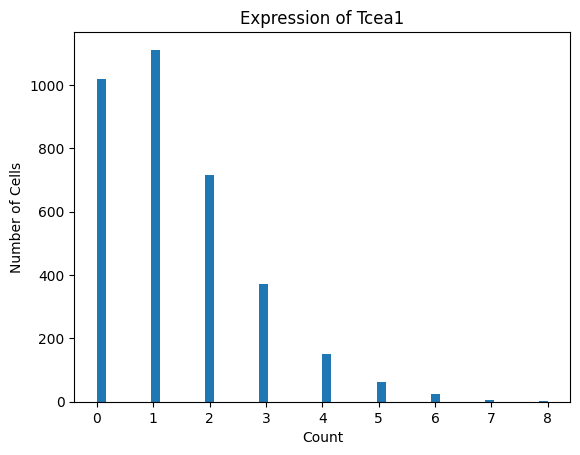

In [2]:
import matplotlib.pyplot as plt

gene = "Tcea1"  # Replace with a gene in your dataset

if gene in df.columns:
    plt.hist(df[gene].astype(float), bins=50)
    plt.title(f"Expression of {gene}")
    plt.xlabel("Count")
    plt.ylabel("Number of Cells")
    plt.show()
else:
    print(f"Gene {gene} not found in dataset.")

In [3]:
from scipy.io import mmread
import numpy as np

# Load sparse matrix
mtx = mmread("matrix.mtx")

# Convert to dense NumPy array if small
dense_mtx = mtx.toarray()

# View first few rows
print(dense_mtx)

[[8 2 2 ... 5 5 0]
 [1 1 1 ... 3 3 0]
 [4 0 1 ... 0 3 2]
 ...
 [1 2 0 ... 1 1 1]
 [0 0 0 ... 0 0 0]
 [2 0 1 ... 0 0 0]]


✅ Loaded data: (2730, 3451) (cells, genes)


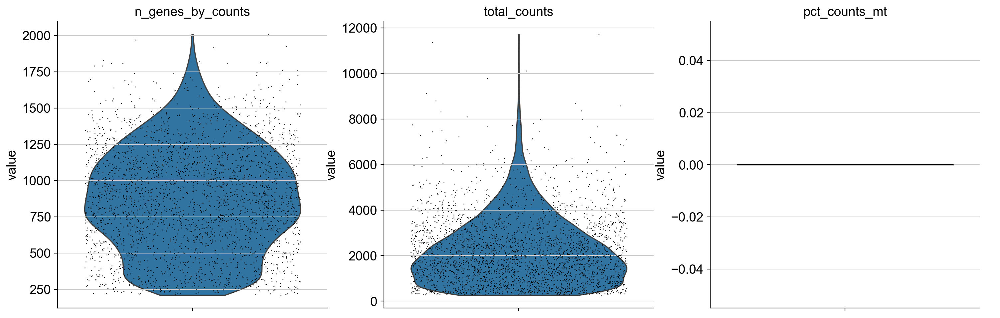

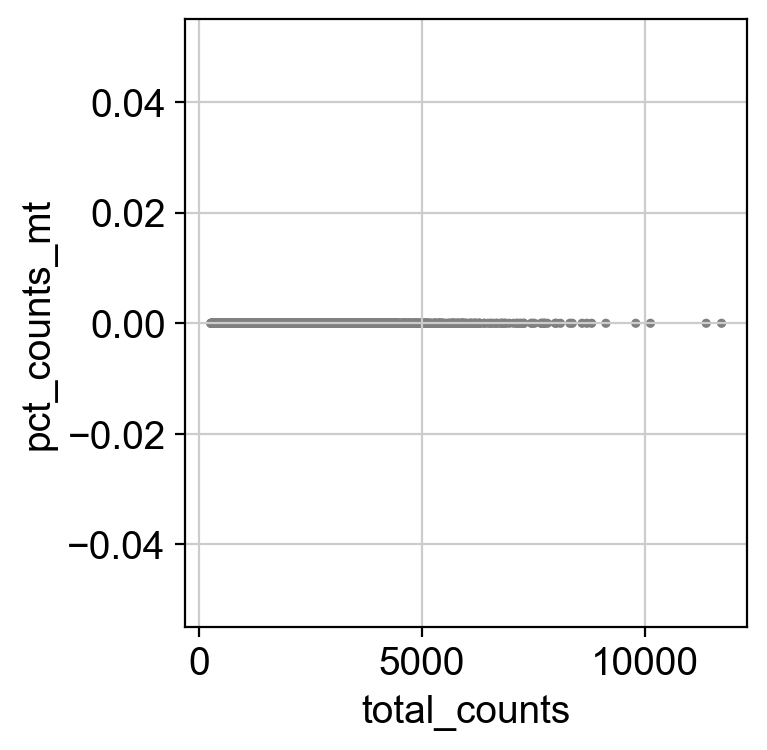

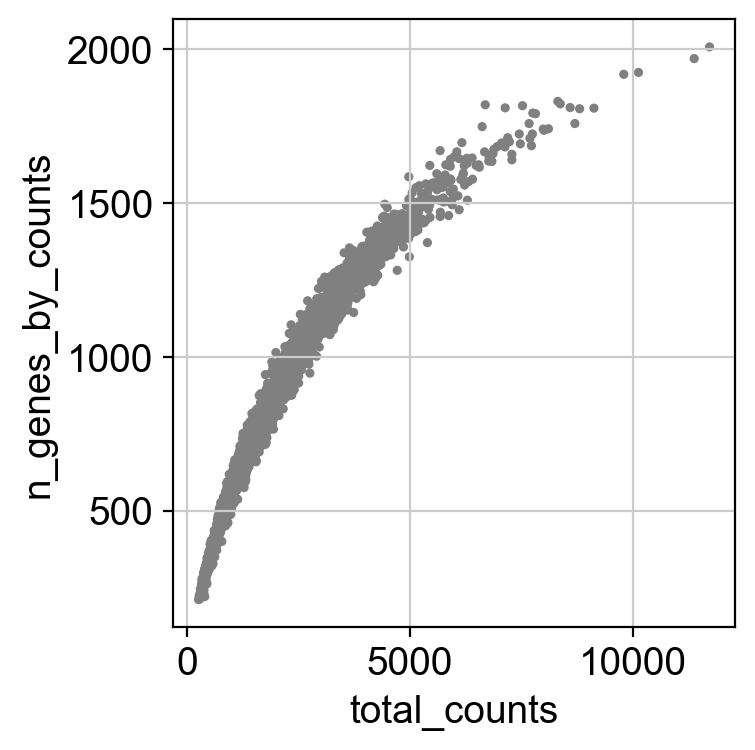

🔎 Before filtering: (2730, 3267)
✅ After filtering: (2589, 3267)


/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


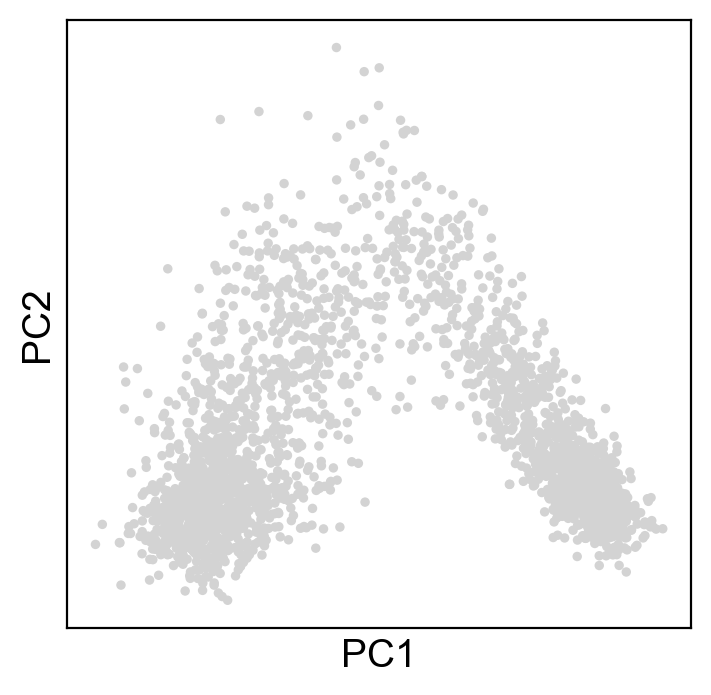

/var/folders/ql/5nmrkn3145n9_pzr7h7w7_gh0000gn/T/ipykernel_1903/2091442865.py:92: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.5)


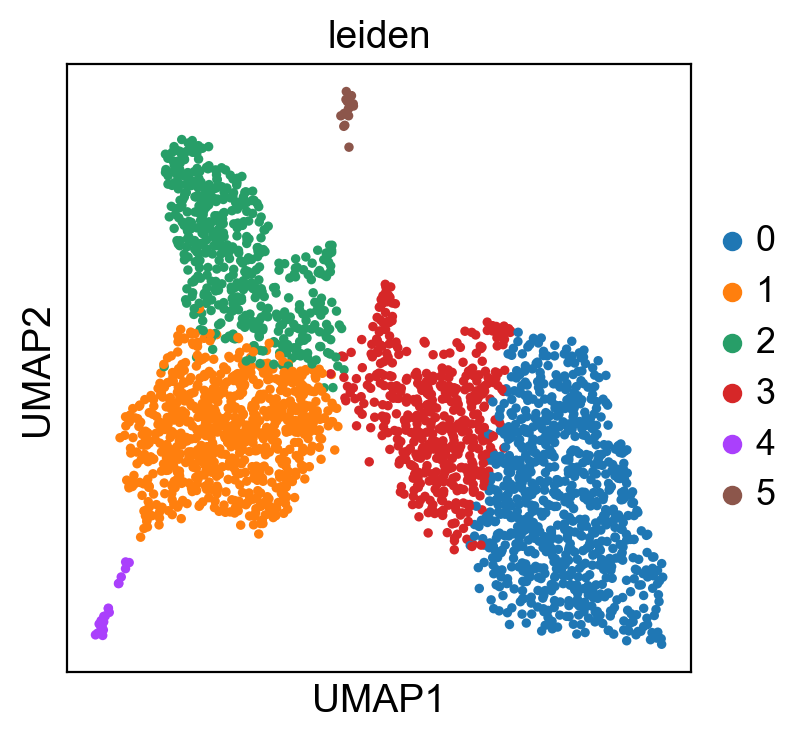

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "log

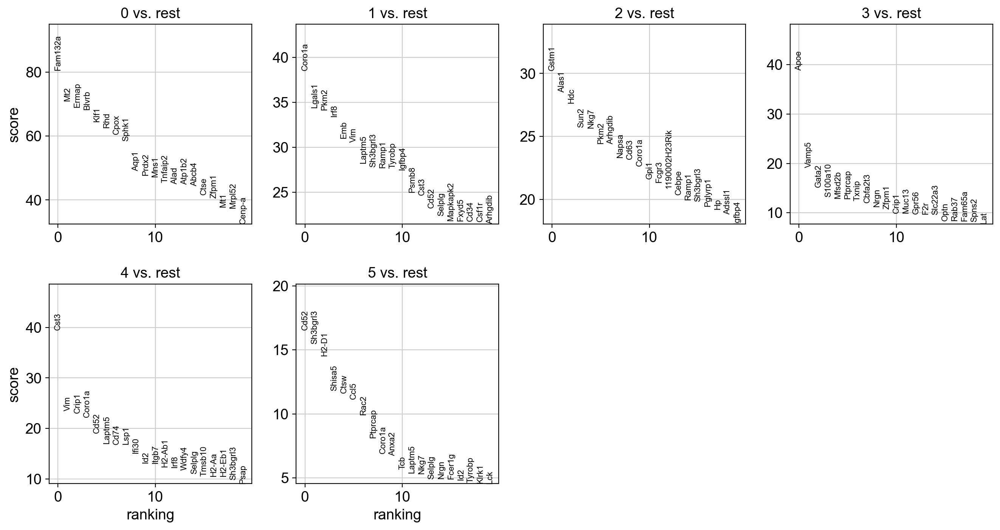

saving figure to file figures/umap_clusters.png


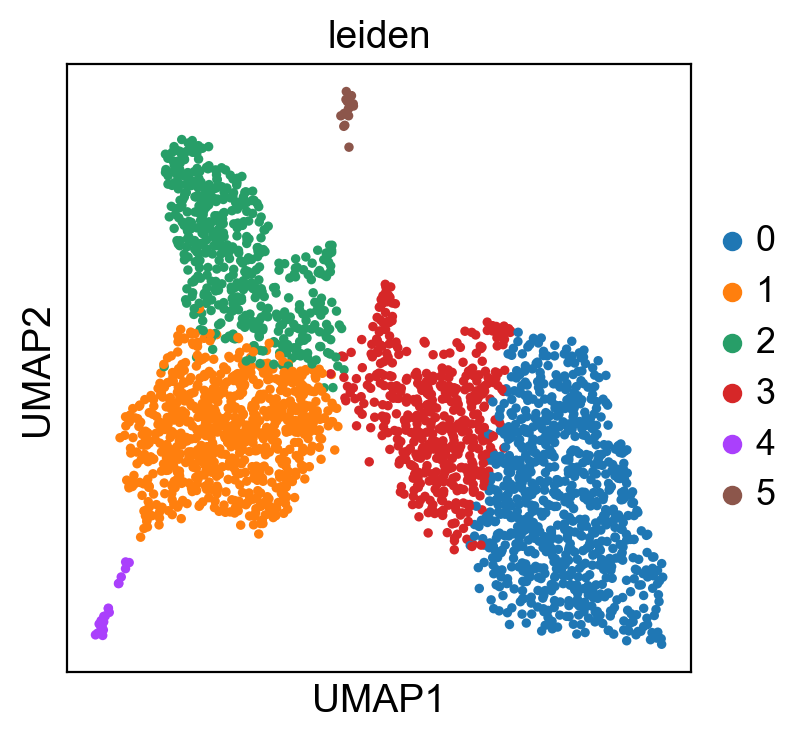

✅ Pipeline complete!
 - processed_data.h5ad
 - marker_genes.csv
 - UMAP plot saved


In [2]:
# 📦 Imports
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# ──────────────────────────────────────────────
# 🔧 Scanpy Settings
# ──────────────────────────────────────────────
sc.settings.verbosity = 3
sc.set_figure_params(dpi=100, facecolor='white')

# ──────────────────────────────────────────────
# 📁 Load Data
# ──────────────────────────────────────────────
# Example dataset — replace with your actual 10x directory
# data_dir = "path/to/10x_data"
# adata = sc.read_10x_mtx(data_dir, var_names='gene_symbols', cache=True)

adata = sc.datasets.paul15()  # REMOVE this line when using real data
print(f"✅ Loaded data: {adata.shape} (cells, genes)")

# ──────────────────────────────────────────────
# 🧼 Step 1: Basic QC
# ──────────────────────────────────────────────
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=30)

# Annotate mitochondrial genes
adata.var['mt'] = adata.var_names.str.upper().str.startswith('MT-')

# Calculate QC metrics
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True)

# Visualize QC metrics
sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True
)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

# ──────────────────────────────────────────────
# 🧼 Step 2: Filtering
# ──────────────────────────────────────────────
print("🔎 Before filtering:", adata.shape)

# Adjust thresholds as needed
adata = adata[(adata.obs.n_genes_by_counts < 6000) &
              (adata.obs.n_genes_by_counts > 300) &
              (adata.obs.pct_counts_mt < 20), :]

print("✅ After filtering:", adata.shape)

if adata.n_obs == 0:
    raise ValueError("❌ All cells removed during filtering — adjust thresholds.")

# ──────────────────────────────────────────────
# 🧪 Step 3: Normalize & Log-transform
# ──────────────────────────────────────────────
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# ──────────────────────────────────────────────
# 🔍 Step 4: Highly Variable Genes
# ──────────────────────────────────────────────
sc.pp.highly_variable_genes(
    adata,
    min_mean=0.0125,
    max_mean=3,
    min_disp=0.5
)
adata = adata[:, adata.var.highly_variable]

# ──────────────────────────────────────────────
# 🔬 Step 5: Scale & PCA
# ──────────────────────────────────────────────
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata)

# ──────────────────────────────────────────────
# 🤝 Step 6: Neighbors & UMAP
# ──────────────────────────────────────────────
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)

# ──────────────────────────────────────────────
# 🔖 Step 7: Clustering
# ──────────────────────────────────────────────
sc.tl.leiden(adata, resolution=0.5)
sc.pl.umap(adata, color=['leiden'])

# ──────────────────────────────────────────────
# 🧬 Step 8: Marker Gene Discovery
# ──────────────────────────────────────────────
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

marker_df = sc.get.rank_genes_groups_df(adata, group=None)
marker_df.to_csv("marker_genes.csv", index=False)

# ──────────────────────────────────────────────
# 💾 Step 9: Save Results
# ──────────────────────────────────────────────
adata.write("processed_data.h5ad")
sc.pl.umap(adata, color=['leiden'], save="_clusters.png")

print("✅ Pipeline complete!")
print(" - processed_data.h5ad")
print(" - marker_genes.csv")
print(" - UMAP plot saved")


In [5]:
# Step 1: Build graph (Scanpy or custom)
# Step 2: Train GNN to embed state
# Step 3: Create Gym-style environment for cell fate transitions
# Step 4: Train RL agent with GNN-based policy


#scRNA-seq data → Gene Expression Matrix → GRN Inference (SCENIC / GRNBoost)
#         ↓
#    Graph: Genes = nodes, regulation = edges
#         ↓
#    GNN → encodes current cell state from GRN
#         ↓
#RL Agent (PPO, A2C, etc.)
 #        ↓
# Selects action (TF activation, perturbation)
  #       ↓
#Environment simulates cell transition → Next GRN-encoded state


In [8]:
# Install dependencies if needed (Uncomment in Colab)
# !pip install scanpy torch torchvision torchaudio torch-geometric stable-baselines3 sb3-contrib

import scanpy as sc
import numpy as np
import torch
import gym
from gym import spaces
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from stable_baselines3 import PPO
from stable_baselines3 import PPO
from sb3_contrib import TRPO
from stable_baselines3.common.vec_env import DummyVecEnv
import matplotlib.pyplot as plt
import os

# Step 1: Load and preprocess real scRNA-seq data
adata = sc.read_10x_mtx("Untitled Folder 3/")
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_genes(adata, min_cells=20)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var.highly_variable]
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=10)

# Step 2: Construct graph for PyTorch Geometric
# Step 2: Construct graph for PyTorch Geometric
edges = adata.obsp['connectivities'].tocoo()
edge_index = torch.tensor([edges.row, edges.col], dtype=torch.long)
x = torch.tensor(adata.X, dtype=torch.float)
graph_data = Data(x=x, edge_index=edge_index)

# Define gene names list for later use
gene_names = adata.var_names.tolist()

# Step 3: Define GNN
class CellGNN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels=64, out_channels=32):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

model = CellGNN(in_channels=x.shape[1])
model.eval()
with torch.no_grad():
    embeddings = model(graph_data).numpy()

# Dummy labels (replace with real if available)
if 'true_label' not in adata.obs:
    adata.obs['true_label'] = np.random.randint(0, 3, size=(adata.shape[0],))
labels = adata.obs['true_label'].values

import numpy as np

import numbers
import numpy as np

def simulate_crispr(raw_expr_vec, knockout_gene_idx=None, severity=0.8):
    perturbed = raw_expr_vec.copy()
    if knockout_gene_idx is not None:
        # Convert 0-d numpy array to python int
        if isinstance(knockout_gene_idx, np.ndarray) and knockout_gene_idx.ndim == 0:
            knockout_gene_idx = knockout_gene_idx.item()
        
        if isinstance(knockout_gene_idx, numbers.Integral) or np.isscalar(knockout_gene_idx):
            knockout_gene_idx = [int(knockout_gene_idx)]
        for idx in knockout_gene_idx:
            perturbed[..., idx] *= (1 - severity)
    
    noise = np.random.normal(0, 0.01, size=perturbed.shape)
    perturbed += noise
    perturbed = np.clip(perturbed, 0, None)
    return perturbed


# Step 5: Define custom Gym environment
# Step 3: Define Gym Environment

class GRNEnv(gym.Env):
    def __init__(self, x, labels, gene_names, perturb=True):
        super(GRNEnv, self).__init__()
        self.x = x  # cell embeddings (numpy array or torch tensor)
        self.labels = labels  # 1D array of class labels
        self.gene_names = gene_names  # List of gene names corresponding to features
        self.perturb = perturb

        self.n_nodes = x.shape[0]
        self.n_features = x.shape[1]
        self.n_classes = len(np.unique(labels))
        self.idx = 0  # current cell index

        # Observation space is continuous vector of length = number of features
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(self.n_features,), dtype=np.float32)
        
        # Action space: currently set to number of classes (e.g., cell types or labels)
        self.action_space = spaces.Discrete(self.n_classes)

    def reset(self):
        # Sample a random cell index
        self.idx = np.random.randint(0, self.n_nodes)
        obs = self.x[self.idx]

        if self.perturb:
            # Example: perturb cell expression embedding by simulating CRISPR knockout
            obs = simulate_crispr(obs)

        return obs.astype(np.float32)

    def step(self, action):
        # Retrieve true label for current cell
        true_label = self.labels[self.idx]

        # Reward: +1 if action matches true label, else -1
        reward = 1.0 if action == true_label else -1.0

        done = True  # One-step episode

        obs = self.x[self.idx]  # next observation (unchanged here)

        info = {"true_label": int(true_label)}

        return obs.astype(np.float32), reward, done, info

    def get_gene_name(self, action_idx):
        # Return gene name for a given action index (assuming action indexes genes)
        return self.gene_names[action_idx]


# Step 6: Train with PPO
#env = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])



#agent = PPO("MlpPolicy", env,
 #           learning_rate=3e-4,
  #          gamma=0.99,
   #         gae_lambda=0.95,
    #        n_steps=2048,
    #        ent_coef=0.01,
    #        clip_range=0.2,
     #       vf_coef=0.5,
      #      batch_size=64,
       #     n_epochs=10,
        #    verbose=1)
#agent.learn(total_timesteps=50000)


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
import numpy as np

def evaluate(agent, n_episodes=1000, n_classes=None, verbose=True):
    env_eval = GRNEnv(embeddings, labels, gene_names, perturb=True)

    y_true = []
    y_pred = []
    y_prob = []

    for _ in range(n_episodes):
        obs = env_eval.reset()
        action, _states = agent.predict(obs, deterministic=False)

        # Optional: Get action probabilities if available
        # Most SB3 models have policy object: agent.policy.predict_values or ._predict
        # For now, we assume discrete action
        dist = agent.policy.get_distribution(agent.policy.obs_to_tensor(obs)[0])
        probs = dist.distribution.probs.detach().cpu().numpy()

        y_pred.append(int(action))
        y_true.append(int(env_eval.labels[env_eval.idx]))
        y_prob.append(probs[0])  # probs[0] if batch size is 1

    # Metrics
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    cm = confusion_matrix(y_true, y_pred)

    # AUROC
    y_true_onehot = np.eye(n_classes)[y_true] if n_classes else np.eye(len(set(y_true)))[y_true]
    try:
        auroc = roc_auc_score(y_true_onehot, np.array(y_prob), multi_class='ovr')
    except:
        auroc = None

    if verbose:
        print(f"📊 Evaluation over {n_episodes} episodes:")
        print(f"✅ Accuracy:  {acc:.4f}")
        print(f"🎯 Precision: {prec:.4f}")
        print(f"📥 Recall:    {rec:.4f}")
        print(f"📈 F1 Score:  {f1:.4f}")
        print(f"🔵 AUROC:     {auroc:.4f}" if auroc is not None else "🔴 AUROC: could not be computed")
        print(f"🧾 Confusion Matrix:\n{cm}")

    return {
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "auroc": auroc,
        "confusion_matrix": cm,
        "true_labels": y_true,
        "predicted_labels": y_pred
    }



    
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import warnings

def evaluate_dqn(model,  n_episodes=1000, verbose=True):
    y_true = []
    y_pred = []
    env = GRNEnv(embeddings, labels, gene_names, perturb=True)
    for _ in range(n_episodes):
        obs = env.reset()
        done = False
        while not done:
            action, _ = model.predict(obs, deterministic=False)
            obs, reward, done, info = env.step(action)

            # Assuming the environment provides true label via `info['true_label']`
            # Otherwise, replace this with env.y or a custom env method like env.get_true_label()
            if isinstance(info, list):
                label = info[0].get('true_label')
            else:
                label = info.get('true_label')

            y_true.append(label)
            y_pred.append(int(action))

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average="weighted", zero_division=0)
    rec = recall_score(y_true, y_pred, average="weighted", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="weighted", zero_division=0)
    cm = confusion_matrix(y_true, y_pred)

    # AUROC: Only if >1 class in y_true
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        try:
            auroc = roc_auc_score(y_true, y_pred, multi_class="ovo", average="weighted")
        except:
            auroc = None

    if verbose:
        print(f"📊 Evaluation over {n_episodes} episodes:")
        print(f"✅ Accuracy:  {acc:.4f}")
        print(f"🎯 Precision: {prec:.4f}")
        print(f"📥 Recall:    {rec:.4f}")
        print(f"📈 F1 Score:  {f1:.4f}")
        print(f"🔵 AUROC:     {auroc:.4f}" if auroc is not None else "🔴 AUROC: could not be computed")
        print(f"🧾 Confusion Matrix:\n{cm}")

    return {
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "auroc": auroc,
        "confusion_matrix": cm,
        "true_labels": y_true.tolist(),
        "predicted_labels": y_pred.tolist()
    }







from stable_baselines3 import PPO, A2C
from stable_baselines3.common.vec_env import DummyVecEnv
import os


from sb3_contrib import QRDQN
from stable_baselines3.common.env_util import DummyVecEnv

# Make sure your action_space in GRNEnv is of type: gym.spaces.Discrete
dqn_env = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])

# Instantiate and train
dqn_model = QRDQN("MlpPolicy", dqn_env, verbose=1)
dqn_model.learn(total_timesteps=50000)
dqn_model.save("dqn_model")
dqn_model_metrics = evaluate_dqn(dqn_model)



# Create PPO model and train
ppo_env = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])
ppo_model = PPO("MlpPolicy", ppo_env, verbose=1)
ppo_model.learn(total_timesteps=50000)
ppo_model.save("ppo_model")
# Evaluate PPO
print("\n--- Evaluating PPO ---")
ppo_metrics = evaluate(ppo_model)

# Transfer to A2C and continue training
print("\n--- Transferring PPO weights to A2C ---")

env_trpo = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])

# --- Step 2: Train TRPO model
trpo_model = TRPO("MlpPolicy", env_trpo, verbose=1)
trpo_model.learn(total_timesteps=25000)
trpo_model.save("trpo_model_GRN")

# --- Step 3: Create PPO environment (should be the same or similar)
env_ppo = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])

# --- Step 4: Load PPO and transfer weights from TRPO
ppo_model_from_trpo = PPO("MlpPolicy", env_ppo, verbose=1)
ppo_model_from_trpo.policy.load_state_dict(trpo_model.policy.state_dict())

# --- Step 5: Fine-tune with PPO
ppo_model_from_trpo.learn(total_timesteps=25000)
ppo_model_from_trpo.save("ppo_from_trpo_model")



# Evaluate Transferred A2C
print("\n--- Evaluating PPO (from TPRO) ---")
ppo_model_from_trpo_metrics = evaluate(ppo_model_from_trpo)

a2c_env = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])

# Train A2C from scratch for comparison
a2c_fresh_model = A2C("MlpPolicy", a2c_env, verbose=1)
a2c_fresh_model.learn(total_timesteps=50000)
a2c_fresh_model.save("a2c_fresh_model")

# Evaluate A2C trained from scratch
print("\n--- Evaluating A2C (Fresh) ---")
a2c_fresh_metrics = evaluate(a2c_fresh_model)





# Compare all three models
print("\n=== Summary of Performance ===")
print("PPO:")
for k, v in ppo_metrics.items():
    if isinstance(v, (int, float)):
        print(f"  {k}: {v:.4f}")

print("\PPO (from TPRO):")
for k, v in ppo_model_from_trpo_metrics.items():
    if isinstance(v, (int, float)):
        print(f"  {k}: {v:.4f}")

print("\nA2C:")
for k, v in a2c_fresh_metrics.items():
    if isinstance(v, (int, float)):
        print(f"  {k}: {v:.4f}")

print("\dqn:")
for k, v in dqn_model_metrics.items():
    if isinstance(v, (int, float)):
        print(f"  {k}: {v:.4f}")




# Save agent
#os.makedirs("checkpoints", exist_ok=True)
#agent.save("checkpoints/cell_policy_ppo")


#

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/boabangfrancis/anaconda3/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 3442     |
|    time_elapsed     | 0        |
|    total_timesteps  | 4        |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 3110     |
|    time_elapsed     | 0        |
|    total_timesteps  | 8        |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 3166     |
|    time_elapsed     | 0        |
|    total_timesteps  | 12       |
----------------------------------
----------------------------------
| r

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


----------------------------------
| rollout/            |          |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 128      |
|    fps              | 646      |
|    time_elapsed     | 0        |
|    total_timesteps  | 128      |
| train/              |          |
|    learning_rate    | 5e-05    |
|    loss             | 50.2     |
|    n_updates        | 6        |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 132      |
|    fps              | 624      |
|    time_elapsed     | 0        |
|    total_timesteps  | 132      |
| train/              |          |
|    learning_rate    | 5e-05    |
|    loss             | 50.4     |
|    n_updates        | 7        |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rat

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


-----------------------------
| time/              |      |
|    fps             | 6012 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 4065        |
|    iterations           | 2           |
|    time_elapsed         | 1           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.008354694 |
|    clip_fraction        | 0.0326      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.09       |
|    explained_variance   | -0.0449     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.414       |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00807    |
|    value_loss           | 0.924       |
-----------------------------------------
----------------------------------

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


-----------------------------
| time/              |      |
|    fps             | 6152 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 2048 |
-----------------------------
----------------------------------------
| time/                     |          |
|    fps                    | 5196     |
|    iterations             | 2        |
|    time_elapsed           | 0        |
|    total_timesteps        | 4096     |
| train/                    |          |
|    explained_variance     | -0.0761  |
|    is_line_search_success | 1        |
|    kl_divergence_loss     | 0.0042   |
|    learning_rate          | 0.001    |
|    n_updates              | 1        |
|    policy_objective       | 0.0148   |
|    value_loss             | 0.892    |
----------------------------------------
----------------------------------------
| time/                     |          |
|    fps                    | 4988     |
|    iterations             | 3        |
|    time_e

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


------------------------------------
| time/                 |          |
|    fps                | 2679     |
|    iterations         | 200      |
|    time_elapsed       | 0        |
|    total_timesteps    | 1000     |
| train/                |          |
|    entropy_loss       | -1.03    |
|    explained_variance | 0.0422   |
|    learning_rate      | 0.0007   |
|    n_updates          | 199      |
|    policy_loss        | 0.584    |
|    value_loss         | 1.04     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 2641     |
|    iterations         | 300      |
|    time_elapsed       | 0        |
|    total_timesteps    | 1500     |
| train/                |          |
|    entropy_loss       | -1.08    |
|    explained_variance | -0.147   |
|    learning_rate      | 0.0007   |
|    n_updates          | 299      |
|    policy_loss        | 1.04     |
|    value_loss         | 1.71     |
-

In [39]:
# updated_scRL_like_pipeline_full_patch.py
"""
Improved and extended version of the scRL-like pipeline you provided.
Key updates made:
- Added optional GAT autoencoder + encoder and a `use_gat` switch to choose GCN vs GAT.
- Cleaner save / load semantics for AE and encoder (save state_dicts + architecture info variable).
- Fixed evaluation pseudotime collection so pseudotimes are gathered per episode (not only for gene 0).
- Minor robustness fixes for device placement, deterministic seeding in env.reset(), and VecNormalize save path.
- Reduced default AE epochs for quicker testing; you can restore original values for full runs.
- Docstrings and comments for clarity.
"""

import scanpy as sc
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import SubprocVecEnv
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.vec_env import VecNormalize
from scipy.sparse import issparse
from torch_geometric.nn import GCNConv
from torch_geometric.utils import dense_to_sparse
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import defaultdict
import warnings
import time
import os

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ----------------- Repro seeds & device -----------------
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
DEVICE = torch.device("cpu")  # keep CPU for multiprocess env pickling; change if using single-process GPU

# ----------------- Config / Hyperparams -----------------
N_GENES_SELECT = 10         # try 50-200 (was 10)
GCN_HIDDEN = 64
GCN_EMB = 32
AE_TRAIN_EPOCHS = 200      # lowered for faster testing; set 1000+ for final runs
SAC_TOTAL_TIMESTEPS = 500000  # increase to 500k+ for full runs
SAC_POLICY_ARCH = [256, 256]
SAC_BATCH_SIZE = 128
SAC_BUFFER = int(1e6)
LEARNING_STARTS = 1000
USE_GAT = False  # set True to use GAT AE / encoder instead of GCN

# ----------------- Adaptive Threshold Class (robust) -----------------
class PerGeneAdaptiveThreshold:
    def __init__(self, gene_list, alpha=0.1):
        self.thresholds = {int(g): 0.0 for g in gene_list}
        self.alpha = alpha

    def update(self, gene_rewards):
        for gene_id, reward in gene_rewards.items():
            if reward is None or (isinstance(reward, float) and np.isnan(reward)):
                continue
            gid = int(gene_id)
            prev = self.thresholds.get(gid, 0.0)
            self.thresholds[gid] = self.alpha * float(reward) + (1 - self.alpha) * prev

    def get(self, gene_id):
        return float(self.thresholds.get(int(gene_id), 0.0))

# ----------------- Step 1: Load & preprocess scRNA-seq data -----------------
# adata = sc.read_10x_mtx("path/to/10x")  # uncomment and set path for real data
adata = sc.datasets.paul15()  # example dataset (remove for real data)

# Basic filters: tune thresholds to dataset size
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=30)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, inplace=True)
adata = adata[:, adata.var.highly_variable]
sc.tl.pca(adata)

# ----------------- Step 2: Pseudotime inference (DPT) -----------------
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)
sc.tl.diffmap(adata)
adata.uns['iroot'] = 0
sc.tl.dpt(adata)
pseudotime = adata.obs['dpt_pseudotime'].values

# ----------------- Step 3: Gene selection via mutual information -----------------
# Convert X to dense numpy
X_full = adata.X.toarray() if issparse(adata.X) else np.asarray(adata.X)
y = pseudotime
mi_scores = mutual_info_regression(X_full, y, discrete_features=False, random_state=SEED)

N = min(N_GENES_SELECT, X_full.shape[1])
top_gene_indices = np.argsort(mi_scores)[-N:]
# Subset X and adata to selected genes
X = X_full[:, top_gene_indices].astype(np.float32)
adata = adata[:, top_gene_indices]
# Keep original var names as selected
selected_gene_names = list(adata.var_names)

# ----------------- Step 4: Train/test split and normalization -----------------
n_cells, n_genes = X.shape
indices = np.arange(n_cells)
train_idx, test_idx = train_test_split(indices, test_size=0.2, random_state=SEED, shuffle=True)
expression_train = X[train_idx]
expression_test = X[test_idx]
pseudotime_train = pseudotime[train_idx]
pseudotime_test = pseudotime[test_idx]

# Per-gene z-score normalization using training stats (apply to both train/test)
gene_means = expression_train.mean(axis=0)
gene_stds = expression_train.std(axis=0) + 1e-8
expression_train = (expression_train - gene_means) / gene_stds
expression_test = (expression_test - gene_means) / gene_stds
# also update X (normalized view) if needed later
X = np.vstack([expression_train, expression_test])

# ----------------- Step 5: Adjacency matrix (weighted by Pearson + precedence) -----------------
# Compute peak pseudotime per gene using original (un-normalized) values to find precedence
# Use X_full subset for peak location (original scale)
X_full_selected = X_full[:, top_gene_indices]  # original scale
peak_pt = np.zeros(n_genes, dtype=float)
order = np.argsort(pseudotime)
for g in range(n_genes):
    vals = X_full_selected[order, g]
    peak_idx = int(np.nanargmax(vals))
    peak_pt[g] = pseudotime[order][peak_idx]

# Pearson correlation between genes (on normalized training + test merged)
corr_matrix = np.corrcoef(np.vstack([expression_train, expression_test]).T)
# Use correlation as weights but zero-out self
adj_matrix = np.zeros_like(corr_matrix)
corr_threshold = 0.5  # lower threshold to keep more edges
for i in range(n_genes):
    for j in range(n_genes):
        if i == j:
            continue
        # precedence: i peaks earlier than j
        if peak_pt[i] < peak_pt[j] and abs(corr_matrix[i, j]) >= corr_threshold:
            # keep signed correlation weight
            adj_matrix[i, j] = float(corr_matrix[i, j])

# Convert adjacency to torch sparse edge_index and keep weights
adj_tensor = torch.tensor(adj_matrix, dtype=torch.float32)
edge_index, edge_weight = dense_to_sparse(adj_tensor)  # edge_weight corresponds to correlation values
edge_index = edge_index.long().cpu()
edge_weight = edge_weight.float().cpu()

# ----------------- Step 6: GCN (or GAT) autoencoder pretrain -----------------
# Define GCN AE used to produce meaningful embeddings
class GCN_AE(nn.Module):
    def __init__(self, in_dim=1, hidden_dim=GCN_HIDDEN, emb_dim=GCN_EMB):
        super().__init__()
        self.enc1 = GCNConv(in_dim, hidden_dim)
        self.enc2 = GCNConv(hidden_dim, emb_dim)
        self.dec = nn.Sequential(
            nn.Linear(emb_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, in_dim)
        )

    def forward(self, x, edge_index):
        x = self.enc1(x, edge_index)
        x = F.relu(x)
        emb = self.enc2(x, edge_index)
        recon = self.dec(emb)
        return recon, emb

# Optional: GAT AE (if you want attention-based encoder)
try:
    from torch_geometric.nn import GATConv
    class GAT_AE(nn.Module):
        def __init__(self, in_dim=1, hidden_dim=64, emb_dim=32, heads=4):
            super().__init__()
            self.enc1 = GATConv(in_dim, hidden_dim, heads=heads)
            self.enc2 = GATConv(hidden_dim * heads, emb_dim, heads=1)
            self.dec = nn.Sequential(
                nn.Linear(emb_dim, hidden_dim),
                nn.ELU(),
                nn.Linear(hidden_dim, in_dim)
            )

        def forward(self, x, edge_index):
            x = self.enc1(x, edge_index)
            x = F.elu(x)
            emb = self.enc2(x, edge_index)
            recon = self.dec(emb)
            return recon, emb
except Exception:
    GAT_AE = None

# Pretrain AE on mean expression profile across training cells (gene-wise)
mean_expr = np.mean(expression_train, axis=0).reshape(-1, 1).astype(np.float32)  # (n_genes,1)
x_input = torch.tensor(mean_expr)

if USE_GAT and GAT_AE is not None:
    ae_model = GAT_AE(in_dim=1, hidden_dim=GCN_HIDDEN, emb_dim=GCN_EMB, heads=4).to(DEVICE)
    AE_NAME = "gat_ae.pth"
    ENCODER_NAME = "gat_encoder.pth"
else:
    ae_model = GCN_AE(in_dim=1, hidden_dim=GCN_HIDDEN, emb_dim=GCN_EMB).to(DEVICE)
    AE_NAME = "gcn_ae.pth"
    ENCODER_NAME = "gcn_encoder.pth"

opt = torch.optim.Adam(ae_model.parameters(), lr=1e-3, weight_decay=1e-5)
loss_fn = nn.MSELoss()

ae_model.train()
print("\n--- Pretraining AE ---")
for epoch in range(AE_TRAIN_EPOCHS):
    opt.zero_grad()
    recon, emb = ae_model(x_input.to(DEVICE), edge_index.to(DEVICE))
    loss = loss_fn(recon.squeeze(), x_input.squeeze())
    loss.backward()
    opt.step()
    if (epoch + 1) % 50 == 0 or epoch == 0:
        print(f"AE epoch {epoch+1}/{AE_TRAIN_EPOCHS} loss {loss.item():.6f}")
# Save
torch.save(ae_model.state_dict(), AE_NAME)
ae_model.eval()

# ----------------- Step 7: Encoder wrapper for env to produce embeddings -----------------
class GeneGCN_Encoder(nn.Module):
    def __init__(self, gcn_ae):
        super().__init__()
        # use the encoder weights only
        self.enc1 = gcn_ae.enc1
        self.enc2 = gcn_ae.enc2

    def forward(self, x, edge_index):
        x = self.enc1(x, edge_index)
        x = F.relu(x)
        emb = self.enc2(x, edge_index)
        return emb

class GeneGAT_Encoder(nn.Module):
    def __init__(self, gat_ae):
        super().__init__()
        self.enc1 = gat_ae.enc1
        self.enc2 = gat_ae.enc2

    def forward(self, x, edge_index):
        x = self.enc1(x, edge_index)
        x = F.elu(x)
        emb = self.enc2(x, edge_index)
        return emb

# Save encoder state_dict for portability
if USE_GAT and GAT_AE is not None:
    encoder = GeneGAT_Encoder(ae_model).to(DEVICE)
else:
    encoder = GeneGCN_Encoder(ae_model).to(DEVICE)
encoder.eval()
# Save only the encoder state dict so we can load it later without needing the full AE class
torch.save(encoder.state_dict(), ENCODER_NAME)

# ----------------- Step 8: RL Environment with CRISPR simulation (continuous/dense reward) -----------------
class GRNEnv(gym.Env):
    metadata = {"render_modes": ["human"]}

    def __init__(self, expression, adj_matrix, pseudotime, edge_index, edge_weight=None,
                 encoder_path=ENCODER_NAME, use_gat=USE_GAT, max_steps=50, adaptive_thresholds=None, normalize_stats=None):
        super().__init__()
        self.expression = np.asarray(expression).astype(np.float32)  # assumed normalized already
        self.adj_matrix = np.asarray(adj_matrix).astype(np.float32)
        self.edge_index = edge_index  # torch.LongTensor on CPU
        self.edge_weight = edge_weight
        self.pseudotime = np.asarray(pseudotime).astype(np.float32)
        self.n_cells, self.n_genes = self.expression.shape
        self.max_steps = max_steps
        self.adaptive_thresholds = adaptive_thresholds
        self.normalize_stats = normalize_stats  # (means, stds) if needed for observations

        # construct encoder architecture and then load weights from encoder_path
        if use_gat and GAT_AE is not None:
            # create dummy GAT_AE to hold layers, then wrap with GeneGAT_Encoder
            base_ae = GAT_AE(in_dim=1, hidden_dim=GCN_HIDDEN, emb_dim=GCN_EMB, heads=4)
            self.encoder = GeneGAT_Encoder(base_ae).to(DEVICE)
        else:
            base_ae = GCN_AE(in_dim=1, hidden_dim=GCN_HIDDEN, emb_dim=GCN_EMB)
            self.encoder = GeneGCN_Encoder(base_ae).to(DEVICE)

        # load encoder weights if available
        if encoder_path and os.path.exists(encoder_path):
            try:
                self.encoder.load_state_dict(torch.load(encoder_path, map_location=DEVICE))
            except Exception:
                # fallback: try loading into wrapper module if names differ
                try:
                    sd = torch.load(encoder_path, map_location=DEVICE)
                    # if keys are prefixed (rare), try stripping prefixes
                    new_sd = {k.replace('module.', ''): v for k, v in sd.items()}
                    self.encoder.load_state_dict(new_sd)
                except Exception as e:
                    print("Could not load encoder weights:", e)
        self.encoder.eval()

        # Observation: per-gene embedding dim (GCN_EMB)
        self.obs_dim = GCN_EMB
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(self.n_genes, self.obs_dim), dtype=np.float32)
        # Action: continuous scalar per gene in [-1,1]
        self.action_space = spaces.Box(low=-1.0, high=1.0, shape=(self.n_genes,), dtype=np.float32)
        self.steps = 0

    def reset(self, seed=None, options=None):
        if seed is not None:
            np.random.seed(seed)
        # pick a random cell
        self.idx = int(np.random.randint(self.n_cells))
        self.current_cell = int(self.idx)
        self.state = self.expression[self.idx].copy()  # normalized expression per gene
        self.original_state = self.state.copy()
        # choose a later cell as target along pseudotime if possible (prefer later pseudotime)
        eligible_idxs = np.where(self.pseudotime > self.pseudotime[self.idx])[0]
        if len(eligible_idxs) == 0:
            eligible_idxs = np.array([self.idx])
        target_idx = int(np.random.choice(eligible_idxs))
        self.target = self.expression[target_idx].copy()
        # pick a gene for per-gene reward diagnostics (not the main objective which is dense)
        self.reward_gene = int(np.random.randint(self.n_genes))
        self.target_value = float(self.target[self.reward_gene])
        self.steps = 0
        self.history = [self.state.copy()]
        self.knockout_genes = set()
        self.overexpressed_genes = set()
        # return observation + empty info for Gymnasium-compatible API
        return self._get_observation().astype(np.float32), {}

    def _get_observation(self):
        # node features: each gene's current expression as scalar feature
        x = torch.tensor(self.state, dtype=torch.float32).view(-1, 1).to(DEVICE)
        with torch.no_grad():
            emb = self.encoder(x, self.edge_index.to(DEVICE)).cpu().numpy()  # (n_genes, obs_dim)
        return emb

    def step(self, action):
        action = np.asarray(action).flatten()
        action = np.clip(action, -1.0, 1.0)
        # continuous effect: additive scaled by action; scale param tunable
        scale = 0.25
        # apply continuous per-gene edit
        self.state = self.state + scale * action * (1.0 + np.abs(self.state))
        self.state = np.clip(self.state, -5.0, 5.0)  # clamp to reasonable range (since z-scored)

        # propagate through weighted adjacency (use adj_matrix float weights)
        if np.any(self.adj_matrix != 0):
            prop = self.adj_matrix.T @ (scale * action)  # continuous propagation (n_genes,)
            self.state = self.state + 0.5 * prop  # attenuation factor

        # compute dense reward: improvement in MSE between state and target
        old_mse = float(np.mean((self.history[-1] - self.target) ** 2)) if len(self.history) > 0 else float(np.mean((self.original_state - self.target) ** 2))
        new_mse = float(np.mean((self.state - self.target) ** 2))
        reward = old_mse - new_mse  # positive when closer (dense signal)

        # optionally add small bonus for improving the diagnostic reward_gene
        gene_improvement = (abs(self.original_state[self.reward_gene] - self.target[self.reward_gene])
                            - abs(self.state[self.reward_gene] - self.target[self.reward_gene]))
        reward += 0.2 * float(gene_improvement)

        # subtract adaptive threshold if provided (keeps thresholds small)
        if self.adaptive_thresholds:
            threshold = self.adaptive_thresholds.get(self.reward_gene)
            reward = float(reward - threshold)

        self.steps += 1
        self.history.append(self.state.copy())
        terminated = self.steps >= self.max_steps
        truncated = False
        info = {"old_mse": old_mse, "new_mse": new_mse, "reward_gene": int(self.reward_gene)}
        return self._get_observation().astype(np.float32), float(reward), terminated, truncated, info

    def render(self, mode='human'):
        print(f"Step {self.steps} - gene {self.reward_gene} value {self.state[self.reward_gene]:.4f}")
        print(f"Knockouts: {sorted(list(self.knockout_genes))}, Overexpressed: {sorted(list(self.overexpressed_genes))}")

# ----------------- Step 9: SAC Training -----------------
print("\n--- Training SAC ---")

gene_list = list(range(expression_train.shape[1]))
adaptive_thresholds = PerGeneAdaptiveThreshold(gene_list)

# env factory to avoid capturing heavy non-picklable objects
def make_env_factory(expression, adj_matrix, pseudotime, edge_index, edge_weight, encoder_path, adaptive_thresholds, use_gat=USE_GAT):
    def _init():
        return GRNEnv(expression, adj_matrix, pseudotime, edge_index, edge_weight=edge_weight,
                      encoder_path=encoder_path, use_gat=use_gat, max_steps=50, adaptive_thresholds=adaptive_thresholds)
    return _init

# Build vectorized envs (use DummyVecEnv for simpler pickling if SubprocVecEnv gives trouble)
n_workers = 4
env_fns = [make_env_factory(expression_train, adj_matrix, pseudotime_train, edge_index, edge_weight, ENCODER_NAME, adaptive_thresholds) for _ in range(n_workers)]
try:
    env = SubprocVecEnv(env_fns)
except Exception as e:
    print("SubprocVecEnv failed, falling back to DummyVecEnv:", e)
    env = DummyVecEnv(env_fns)

train_env = VecNormalize(env, norm_obs=True, norm_reward=True, clip_obs=10.)

policy_kwargs = dict(net_arch=SAC_POLICY_ARCH)

model = SAC(
    "MlpPolicy",
    train_env,
    policy_kwargs=policy_kwargs,
    learning_rate=3e-4,
    buffer_size=SAC_BUFFER,
    batch_size=SAC_BATCH_SIZE,
    gamma=0.99,
    tau=0.005,
    ent_coef='auto',
    train_freq=1,
    gradient_steps=1,
    learning_starts=LEARNING_STARTS,
    verbose=1,
    seed=SEED
)

# Train
start_time = time.time()
model.learn(total_timesteps=SAC_TOTAL_TIMESTEPS)
print(f"Training finished in {(time.time()-start_time)/60:.2f} minutes")

# Save model
MODEL_PATH = "sac_grn_model.zip"
model.save(MODEL_PATH)
# Save VecNormalize wrapper stats separately
train_env.save("vecnormalize.pkl")

# ----------------- Step 10: Update Thresholds (robust) -----------------
def update_thresholds(model, env_fn, n_eval=100):
    gene_rewards = defaultdict(list)
    for _ in range(n_eval):
        eval_env = env_fn()
        obs, _ = eval_env.reset()
        gene_id = int(eval_env.reward_gene)
        total_reward = 0.0
        done = False
        while not done:
            action, _ = model.predict(obs, deterministic=True)
            step_out = eval_env.step(action)
            if len(step_out) == 5:
                obs, reward, terminated, truncated, info = step_out
                done = bool(terminated or truncated)
            else:
                obs, reward, done, info = step_out
            # use dense reward accumulated
            total_reward += float(reward)
        gene_rewards[gene_id].append(total_reward)
    avg_rewards = {}
    for g, rlist in gene_rewards.items():
        avg_rewards[g] = float(np.mean(rlist)) if len(rlist) > 0 else 0.0
    adaptive_thresholds.update(avg_rewards)

# call update once (or periodically)
update_thresholds(model, make_env_factory(expression_train, adj_matrix, pseudotime_train, edge_index, edge_weight, ENCODER_NAME, adaptive_thresholds), n_eval=100)

# ----------------- Step 11: Evaluation -----------------
def evaluate_all_genes(model, expression_test, adj_matrix, pseudotime_test, gene_names, edge_index, edge_weight, encoder_path, n_episodes=200):
    results = {}
    all_perturbed_states = {i: [] for i in range(len(gene_names))}
    all_original_states = {i: [] for i in range(len(gene_names))}
    all_pseudotimes = []

    # ensure evaluation env uses same encoder weights
    eval_env_factory = make_env_factory(expression_test, adj_matrix, pseudotime_test, edge_index, edge_weight, encoder_path, adaptive_thresholds)

    for local_idx in range(len(gene_names)):
        y_true, y_pred = [], []
        gene_trajs = []
        gene_idx = local_idx

        for ep in range(n_episodes):
            env = eval_env_factory()
            obs, _ = env.reset()
            original = env.original_state.copy()
            target = env.target.copy()
            pt_value = float(env.pseudotime[env.current_cell])

            done = False
            while not done:
                action, _ = model.predict(obs, deterministic=True)
                step_out = env.step(action)
                if len(step_out) == 5:
                    obs, reward, terminated, truncated, info = step_out
                    done = bool(terminated or truncated)
                else:
                    obs, reward, done, info = step_out

            final_raw_state = env.history[-1]
            # compute delta for local gene index (normalized scale)
            delta = float(final_raw_state[gene_idx] - original[gene_idx])
            # label: whether target (later cell) had higher expression than original for that gene
            label = 1 if target[gene_idx] > original[gene_idx] else 0
            prediction = 1 if delta > 0 else 0

            y_true.append(label)
            y_pred.append(prediction)
            gene_trajs.append(np.array(env.history)[:, gene_idx])

            all_perturbed_states[gene_idx].append(float(final_raw_state[gene_idx]))
            all_original_states[gene_idx].append(float(original[gene_idx]))
            all_pseudotimes.append(pt_value)

        acc = accuracy_score(y_true, y_pred) if len(y_true) > 0 else 0.0
        prec = precision_score(y_true, y_pred, average='weighted', zero_division=0) if len(y_true) > 0 else 0.0
        rec = recall_score(y_true, y_pred, average='weighted', zero_division=0) if len(y_true) > 0 else 0.0
        f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0) if len(y_true) > 0 else 0.0

        results[local_idx] = {
            "gene_name": gene_names[local_idx],
            "accuracy": acc,
            "precision": prec,
            "recall": rec,
            "f1_score": f1,
            "trajectories": gene_trajs[:100]
        }

        print(f"\n--- Eval Gene {local_idx} ({gene_names[local_idx]}) ---")
        print(f"Accuracy:  {acc:.4f}")
        print(f"Precision: {prec:.4f}")
        print(f"Recall:    {rec:.4f}")
        print(f"F1 Score:  {f1:.4f}")

        # quick plot of some trajectories
        plt.figure(figsize=(8, 3))
        for traj in gene_trajs[:10]:
            plt.plot(traj, alpha=0.6)
        plt.xlabel("Step")
        plt.ylabel(f"Gene {gene_names[local_idx]} (normalized)")
        plt.title(f"Perturbation Trajectories — {gene_names[local_idx]}")
        plt.grid(True)
        plt.show()

    return results, all_perturbed_states, all_original_states, all_pseudotimes

results, all_perturbed_states, all_original_states, all_pseudotimes = evaluate_all_genes(
    model=model,
    expression_test=expression_test,
    adj_matrix=adj_matrix,
    pseudotime_test=pseudotime_test,
    gene_names=selected_gene_names,
    edge_index=edge_index,
    edge_weight=edge_weight,
    encoder_path=ENCODER_NAME,
    n_episodes=200
)

# ----------------- Step 12: Visualize perturbation along pseudotime -----------------
for local_idx, gene_name in enumerate(selected_gene_names):
    perturbed = all_perturbed_states[local_idx]
    original = all_original_states[local_idx]
    pseudotimes = all_pseudotimes[:len(perturbed)] if len(all_pseudotimes) > 0 else [0] * len(perturbed)

    if len(perturbed) == 0:
        continue

    df = pd.DataFrame({
        "pseudotime": pseudotimes,
        "original_expression": original[:len(perturbed)],
        "perturbed_expression": perturbed
    })
    df['delta'] = df['perturbed_expression'] - df['original_expression']
    df['label'] = df['delta'].apply(lambda x: "Up" if x > 0 else "Down")

    plt.figure(figsize=(8, 4))
    sns.scatterplot(data=df, x="pseudotime", y="perturbed_expression", hue="label", style="label")
    sns.lineplot(data=df.sort_values('pseudotime'), x="pseudotime", y="perturbed_expression", lw=1, alpha=0.5, label="Mean trajectory")
    plt.title(f"{gene_name} Expression After RL Perturbation (normalized)")
    plt.xlabel("Diffusion Pseudotime")
    plt.ylabel("Perturbed Expression (z-score)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("Done.")


/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_pca/__init__.py:383: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca



--- Pretraining AE ---
AE epoch 1/200 loss 0.000224
AE epoch 50/200 loss 0.000001
AE epoch 100/200 loss 0.000000
AE epoch 150/200 loss 0.000000
AE epoch 200/200 loss 0.000000

--- Training SAC ---
Using cpu device
-----------------------------
| time/              |      |
|    episodes        | 4    |
|    fps             | 3931 |
|    time_elapsed    | 0    |
|    total_timesteps | 200  |
-----------------------------
-----------------------------
| time/              |      |
|    episodes        | 8    |
|    fps             | 4437 |
|    time_elapsed    | 0    |
|    total_timesteps | 400  |
-----------------------------


/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automaticall

-----------------------------
| time/              |      |
|    episodes        | 12   |
|    fps             | 4615 |
|    time_elapsed    | 0    |
|    total_timesteps | 600  |
-----------------------------
-----------------------------
| time/              |      |
|    episodes        | 16   |
|    fps             | 4736 |
|    time_elapsed    | 0    |
|    total_timesteps | 800  |
-----------------------------
-----------------------------
| time/              |      |
|    episodes        | 20   |
|    fps             | 4784 |
|    time_elapsed    | 0    |
|    total_timesteps | 1000 |
-----------------------------
---------------------------------
| time/              |          |
|    episodes        | 24       |
|    fps             | 2225     |
|    time_elapsed    | 0        |
|    total_timesteps | 1200     |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 1.95     |
|    ent_coef        | 0.986    |
|    ent_coef_loss   | -0.242 

Process ForkServerProcess-144:
Process ForkServerProcess-141:
Process ForkServerProcess-143:
Process ForkServerProcess-142:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/boabangfrancis/anaconda3/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/Users/boabangfrancis/anaconda3/lib/python3.11/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/subproc_vec_env.py", line 33, in _worker
    cmd, data = remote.recv()
                ^^^^^^^^^^^^^
  File "/Users/boabangfrancis/anaconda3/lib/python3.11/multiprocessing/connection.py", line 249, in recv
    buf = self._recv_bytes()
          ^^^^^^^^^^^^^^^^^^
  File "/Users/boabangfrancis/anaconda3/lib/python3.11/multiprocessing/process.py", line 314, in _bo

KeyboardInterrupt: 

In [77]:
import scanpy as sc
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import SubprocVecEnv, DummyVecEnv, VecNormalize
from scipy.sparse import issparse
from torch_geometric.nn import GCNConv
from torch_geometric.utils import dense_to_sparse
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import defaultdict
import warnings
import time
import os

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ----------------- Repro seeds & device -----------------
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
DEVICE = torch.device("cpu")  # CPU for multiprocess pickling; change if single-GPU

# ----------------- Config / Hyperparams -----------------
N_GENES_SELECT = 10
GCN_HIDDEN = 64
GCN_EMB = 32
AE_TRAIN_EPOCHS = 1000
SAC_TOTAL_TIMESTEPS = 1000000
SAC_POLICY_ARCH = [256, 256]
SAC_BATCH_SIZE = 128
SAC_BUFFER = int(1e6)
LEARNING_STARTS = 1000

# ----------------- Adaptive Threshold Class -----------------
class PerGeneAdaptiveThreshold:
    def __init__(self, gene_list, alpha=0.1):
        self.thresholds = {int(g): 0.0 for g in gene_list}
        self.alpha = alpha
    def update(self, gene_rewards):
        for gene_id, reward in gene_rewards.items():
            if reward is None or (isinstance(reward, float) and np.isnan(reward)):
                continue
            gid = int(gene_id)
            prev = self.thresholds.get(gid, 0.0)
            self.thresholds[gid] = self.alpha * float(reward) + (1 - self.alpha) * prev
    def get(self, gene_id):
        return float(self.thresholds.get(int(gene_id), 0.0))

# ----------------- Step 1: Load & preprocess data -----------------
#adata = sc.datasets.paul15()

adata = sc.read_10x_mtx("Untitled Folder 3/")

sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=50)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, inplace=True)
adata = adata[:, adata.var.highly_variable]
sc.tl.pca(adata)

# ----------------- Step 2: Pseudotime inference -----------------
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)
sc.tl.diffmap(adata)
adata.uns['iroot'] = 0
sc.tl.dpt(adata)
pseudotime = adata.obs['dpt_pseudotime'].values

# ----------------- Step 3: Gene selection -----------------
X_full = adata.X.toarray() if issparse(adata.X) else np.asarray(adata.X)
y = pseudotime
mi_scores = mutual_info_regression(X_full, y, discrete_features=False, random_state=SEED)
N = min(N_GENES_SELECT, X_full.shape[1])
top_gene_indices = np.argsort(mi_scores)[-N:]
X = X_full[:, top_gene_indices].astype(np.float32)
adata = adata[:, top_gene_indices]
selected_gene_names = list(adata.var_names)

# ----------------- Step 4: Train/test split and normalization -----------------
n_cells, n_genes = X.shape
indices = np.arange(n_cells)
train_idx, test_idx = train_test_split(indices, test_size=0.2, random_state=SEED, shuffle=True)
expression_train = X[train_idx]
expression_test = X[test_idx]
pseudotime_train = pseudotime[train_idx]
pseudotime_test = pseudotime[test_idx]
gene_means = expression_train.mean(axis=0)
gene_stds = expression_train.std(axis=0) + 1e-8
expression_train = (expression_train - gene_means) / gene_stds
expression_test = (expression_test - gene_means) / gene_stds
X = np.vstack([expression_train, expression_test])

# ----------------- Step 5: Adjacency matrix -----------------
X_full_selected = X_full[:, top_gene_indices]
peak_pt = np.zeros(n_genes, dtype=float)
order = np.argsort(pseudotime)
for g in range(n_genes):
    vals = X_full_selected[order, g]
    peak_idx = int(np.nanargmax(vals))
    peak_pt[g] = pseudotime[order][peak_idx]
corr_matrix = np.corrcoef(np.vstack([expression_train, expression_test]).T)
adj_matrix = np.zeros_like(corr_matrix)
corr_threshold = 0.1
for i in range(n_genes):
    for j in range(n_genes):
        if i == j:
            continue
        if peak_pt[i] < peak_pt[j] and abs(corr_matrix[i, j]) >= corr_threshold:
            adj_matrix[i, j] = float(corr_matrix[i, j])
adj_tensor = torch.tensor(adj_matrix, dtype=torch.float32)
edge_index, edge_weight = dense_to_sparse(adj_tensor)
edge_index = edge_index.long().cpu()
edge_weight = edge_weight.float().cpu()

# ----------------- Step 6: GCN Autoencoder -----------------
class GCN_AE(nn.Module):
    def __init__(self, in_dim=1, hidden_dim=GCN_HIDDEN, emb_dim=GCN_EMB):
        super().__init__()
        self.enc1 = GCNConv(in_dim, hidden_dim)
        self.enc2 = GCNConv(hidden_dim, emb_dim)
        self.dec = nn.Sequential(
            nn.Linear(emb_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, in_dim)
        )
    def forward(self, x, edge_index):
        x = self.enc1(x, edge_index)
        x = F.relu(x)
        emb = self.enc2(x, edge_index)
        recon = self.dec(emb)
        return recon, emb

mean_expr = np.mean(expression_train, axis=0).reshape(-1, 1).astype(np.float32)
x_input = torch.tensor(mean_expr)
gcn_ae = GCN_AE(in_dim=1).to(DEVICE)
opt = torch.optim.Adam(gcn_ae.parameters(), lr=1e-3, weight_decay=1e-5)
loss_fn = nn.MSELoss()
gcn_ae.train()
print("\n--- Pretraining GCN-AE ---")
for epoch in range(AE_TRAIN_EPOCHS):
    opt.zero_grad()
    recon, emb = gcn_ae(x_input.to(DEVICE), edge_index.to(DEVICE))
    loss = loss_fn(recon.squeeze(), x_input.squeeze())
    loss.backward()
    opt.step()
    if (epoch + 1) % 50 == 0:
        print(f"AE epoch {epoch+1}/{AE_TRAIN_EPOCHS} loss {loss.item():.6f}")
torch.save(gcn_ae.state_dict(), "gcn_ae.pth")
gcn_ae.eval()

# ----------------- Step 7: GCN Encoder -----------------
class GeneGCN_Encoder(nn.Module):
    def __init__(self, gcn_ae):
        super().__init__()
        self.enc1 = gcn_ae.enc1
        self.enc2 = gcn_ae.enc2
    def forward(self, x, edge_index):
        x = self.enc1(x, edge_index)
        x = F.relu(x)
        emb = self.enc2(x, edge_index)
        return emb

encoder = GeneGCN_Encoder(gcn_ae).to(DEVICE)
encoder.eval()
torch.save(encoder.state_dict(), "gcn_encoder.pth")

# ----------------- Step 8: Dynamics Model -----------------
class DynamicsModel(nn.Module):
    def __init__(self, state_dim, action_dim, hidden_dim=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim + action_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, state_dim),
        )
    def forward(self, state, action):
        x = torch.cat([state, action], dim=-1)
        return self.net(x)

# TODO: Train your dynamics model here with your data!
dynamics_model = DynamicsModel(state_dim=n_genes, action_dim=n_genes)
# e.g. dynamics_model.load_state_dict(torch.load("dynamics_model.pth"))
dynamics_model.to(DEVICE).eval()

# ----------------- Step 9: Model-based Environment -----------------
class GRNEnvModelBased(gym.Env):
    metadata = {"render_modes": ["human"]}
    def __init__(self, expression, adj_matrix, pseudotime, edge_index, edge_weight=None,
                 encoder_path="gcn_encoder.pth", max_steps=50, adaptive_thresholds=None,
                 dynamics_model=None, device='cpu'):
        super().__init__()
        self.expression = np.asarray(expression).astype(np.float32)
        self.adj_matrix = np.asarray(adj_matrix).astype(np.float32)
        self.edge_index = edge_index
        self.edge_weight = edge_weight
        self.pseudotime = np.asarray(pseudotime).astype(np.float32)
        self.n_cells, self.n_genes = self.expression.shape
        self.max_steps = max_steps
        self.adaptive_thresholds = adaptive_thresholds
        self.device = device

        self.encoder = GeneGCN_Encoder(gcn_ae).to(device)
        if os.path.exists(encoder_path):
            try:
                self.encoder.load_state_dict(torch.load(encoder_path, map_location=device))
            except Exception:
                pass
        self.encoder.eval()

        assert dynamics_model is not None, "Provide pretrained dynamics model"
        self.dynamics_model = dynamics_model.to(device)
        self.dynamics_model.eval()

        self.obs_dim = GCN_EMB
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(self.n_genes, self.obs_dim), dtype=np.float32)
        self.action_space = spaces.Box(low=-1.0, high=1.0, shape=(self.n_genes,), dtype=np.float32)
        self.steps = 0

    def reset(self, seed=None, options=None):
        self.idx = np.random.randint(self.n_cells)
        self.current_cell = int(self.idx)
        self.state = self.expression[self.idx].copy()
        self.original_state = self.state.copy()
        eligible_idxs = np.where(self.pseudotime > self.pseudotime[self.idx])[0]
        if len(eligible_idxs) == 0:
            eligible_idxs = np.array([self.idx])
        target_idx = np.random.choice(eligible_idxs)
        self.target = self.expression[target_idx].copy()
        self.reward_gene = int(np.random.randint(self.n_genes))
        self.target_value = float(self.target[self.reward_gene])
        self.steps = 0
        self.history = [self.state.copy()]
        self.knockout_genes = set()
        self.overexpressed_genes = set()
        return self._get_observation().astype(np.float32), {}

    def _get_observation(self):
        x = torch.tensor(self.state, dtype=torch.float32).view(-1,1).to(self.device)
        with torch.no_grad():
            emb = self.encoder(x, self.edge_index.to(self.device)).cpu().numpy()
        return emb

    def step(self, action):
        action = np.clip(np.asarray(action).flatten(), -1.0, 1.0)
        scale = 0.25
        state_tensor = torch.tensor(self.state, dtype=torch.float32).to(self.device).unsqueeze(0)
        action_tensor = torch.tensor(scale * action * (1.0 + np.abs(self.state)), dtype=torch.float32).to(self.device).unsqueeze(0)
        with torch.no_grad():
            next_state = self.dynamics_model(state_tensor, action_tensor).squeeze(0).cpu().numpy()
        self.state = np.clip(next_state, -5.0, 5.0)
        old_mse = float(np.mean((self.history[-1] - self.target)**2)) if len(self.history)>0 else float(np.mean((self.original_state - self.target)**2))
        new_mse = float(np.mean((self.state - self.target)**2))
        reward = old_mse - new_mse
        gene_improvement = (abs(self.original_state[self.reward_gene] - self.target[self.reward_gene])
                            - abs(self.state[self.reward_gene] - self.target[self.reward_gene]))
        reward += 0.2 * float(gene_improvement)
        if self.adaptive_thresholds:
            threshold = self.adaptive_thresholds.get(self.reward_gene)
            reward -= threshold
        self.steps += 1
        self.history.append(self.state.copy())
        terminated = self.steps >= self.max_steps
        truncated = False
        info = {"old_mse": old_mse, "new_mse": new_mse, "reward_gene": int(self.reward_gene)}
        return self._get_observation().astype(np.float32), float(reward), terminated, truncated, info

    def render(self, mode='human'):
        print(f"Step {self.steps} - gene {self.reward_gene} value {self.state[self.reward_gene]:.4f}")
        print(f"Knockouts: {sorted(list(self.knockout_genes))}, Overexpressed: {sorted(list(self.overexpressed_genes))}")

# ----------------- Step 10: SAC Training -----------------
print("\n--- Training SAC ---")

gene_list = list(range(expression_train.shape[1]))
adaptive_thresholds = PerGeneAdaptiveThreshold(gene_list)

def make_env_factory(expression, adj_matrix, pseudotime, edge_index, edge_weight, encoder_path, adaptive_thresholds, dynamics_model):
    def _init():
        return GRNEnvModelBased(expression, adj_matrix, pseudotime, edge_index, edge_weight=edge_weight,
                               encoder_path=encoder_path, max_steps=50, adaptive_thresholds=adaptive_thresholds,
                               dynamics_model=dynamics_model, device=DEVICE)
    return _init

n_workers = 4
env_fns = [make_env_factory(expression_train, adj_matrix, pseudotime_train, edge_index, edge_weight,
                           "gcn_encoder.pth", adaptive_thresholds, dynamics_model) for _ in range(n_workers)]
try:
    env = SubprocVecEnv(env_fns)
except Exception as e:
    print("SubprocVecEnv failed, falling back to DummyVecEnv:", e)
    env = DummyVecEnv(env_fns)
train_env = VecNormalize(env, norm_obs=True, norm_reward=True, clip_obs=10.)

policy_kwargs = dict(net_arch=SAC_POLICY_ARCH)
model = SAC(
    "MlpPolicy",
    train_env,
    policy_kwargs=policy_kwargs,
    learning_rate=3e-4,
    buffer_size=SAC_BUFFER,
    batch_size=SAC_BATCH_SIZE,
    gamma=0.99,
    tau=0.005,
    ent_coef=0.1,
    train_freq=1,
    gradient_steps=1,
    learning_starts=LEARNING_STARTS,
    verbose=1,
    seed=SEED
)

start_time = time.time()
model.learn(total_timesteps=SAC_TOTAL_TIMESTEPS)
print(f"Training finished in {(time.time()-start_time)/60:.2f} minutes")
model.save("sac_grn_model.zip")
train_env.save("vecnormalize.pkl")

# ----------------- (Remaining steps such as threshold updates and evaluation are unchanged) -----------------

print("Done.")


/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_pca/__init__.py:383: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca



--- Pretraining GCN-AE ---
AE epoch 50/1000 loss 0.000000
AE epoch 100/1000 loss 0.000000
AE epoch 150/1000 loss 0.000000
AE epoch 200/1000 loss 0.000000
AE epoch 250/1000 loss 0.000000
AE epoch 300/1000 loss 0.000000
AE epoch 350/1000 loss 0.000000
AE epoch 400/1000 loss 0.000000
AE epoch 450/1000 loss 0.000000
AE epoch 500/1000 loss 0.000000
AE epoch 550/1000 loss 0.000000
AE epoch 600/1000 loss 0.000000
AE epoch 650/1000 loss 0.000000
AE epoch 700/1000 loss 0.000000
AE epoch 750/1000 loss 0.000000
AE epoch 800/1000 loss 0.000000
AE epoch 850/1000 loss 0.000000
AE epoch 900/1000 loss 0.000000
AE epoch 950/1000 loss 0.000000
AE epoch 1000/1000 loss 0.000000

--- Training SAC ---


/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automaticall

Using cpu device
-----------------------------
| time/              |      |
|    episodes        | 4    |
|    fps             | 4771 |
|    time_elapsed    | 0    |
|    total_timesteps | 200  |
-----------------------------
-----------------------------
| time/              |      |
|    episodes        | 8    |
|    fps             | 5212 |
|    time_elapsed    | 0    |
|    total_timesteps | 400  |
-----------------------------
-----------------------------
| time/              |      |
|    episodes        | 12   |
|    fps             | 5465 |
|    time_elapsed    | 0    |
|    total_timesteps | 600  |
-----------------------------
-----------------------------
| time/              |      |
|    episodes        | 16   |
|    fps             | 5594 |
|    time_elapsed    | 0    |
|    total_timesteps | 800  |
-----------------------------
-----------------------------
| time/              |      |
|    episodes        | 20   |
|    fps             | 5652 |
|    time_elapsed    | 


--- Eval Gene 0 (Klf2) ---
Accuracy:  0.5250
Precision: 0.7442
Recall:    0.5250
F1 Score:  0.5430


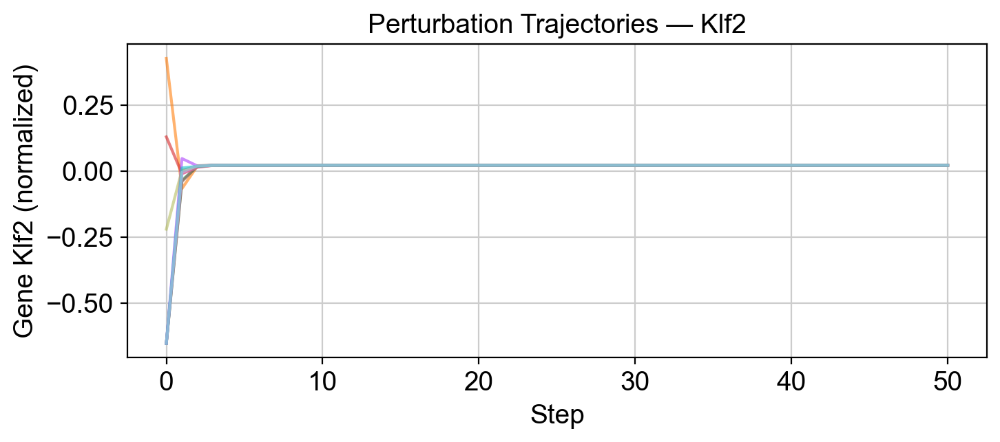


--- Eval Gene 1 (Mef2c) ---
Accuracy:  0.4650
Precision: 0.7933
Recall:    0.4650
F1 Score:  0.5388


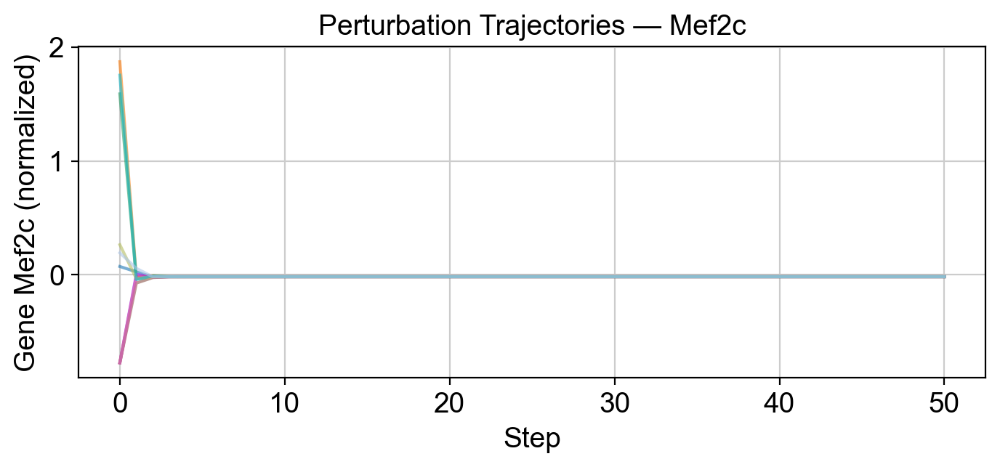


--- Eval Gene 2 (Cd3d) ---
Accuracy:  0.6300
Precision: 0.6238
Recall:    0.6300
F1 Score:  0.6246


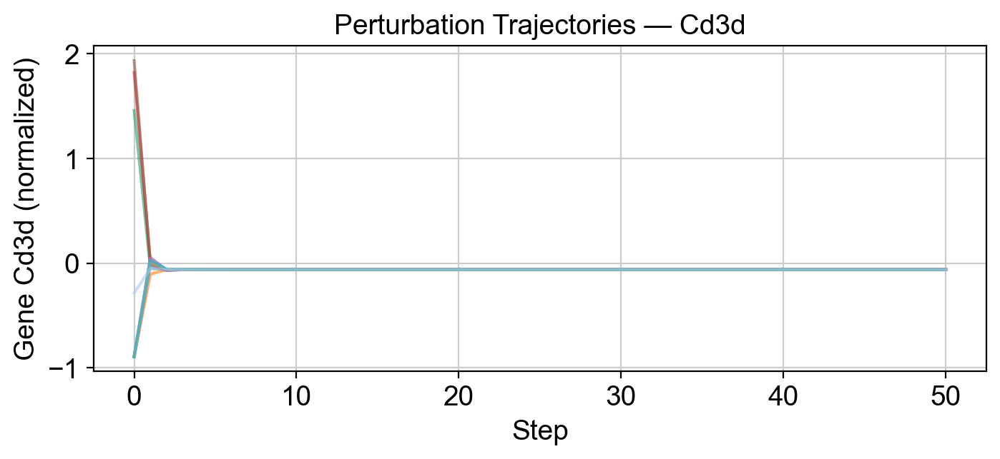


--- Eval Gene 3 (Cd34) ---
Accuracy:  0.5150
Precision: 0.8683
Recall:    0.5150
F1 Score:  0.5765


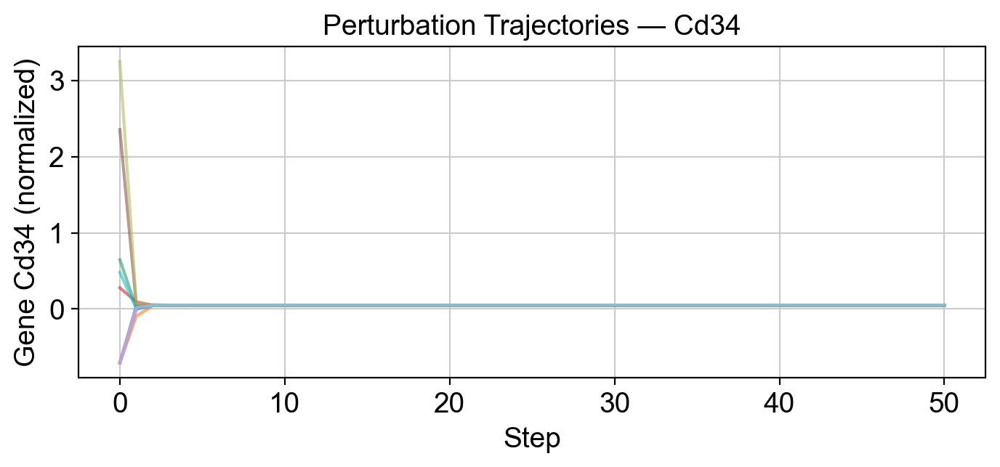


--- Eval Gene 4 (Hmga2) ---
Accuracy:  0.4400
Precision: 0.8134
Recall:    0.4400
F1 Score:  0.4816


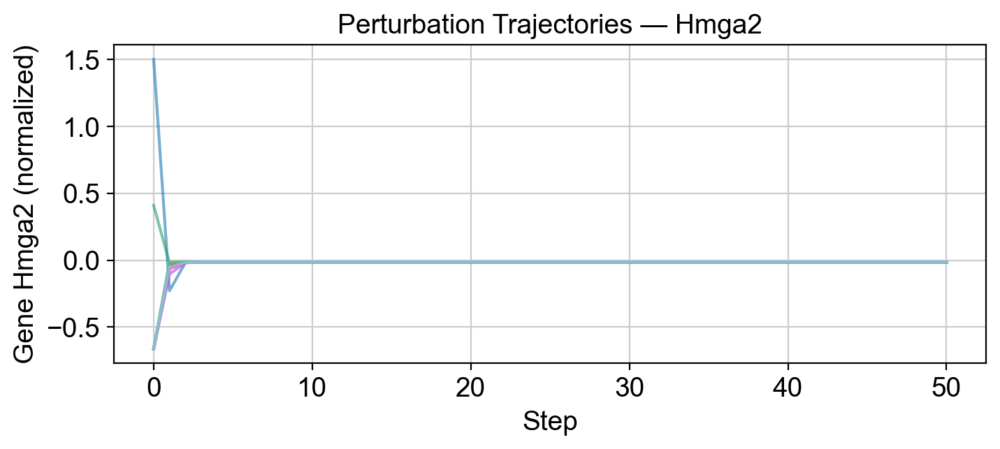


--- Eval Gene 5 (Tspan13) ---
Accuracy:  0.7100
Precision: 0.7680
Recall:    0.7100
F1 Score:  0.7213


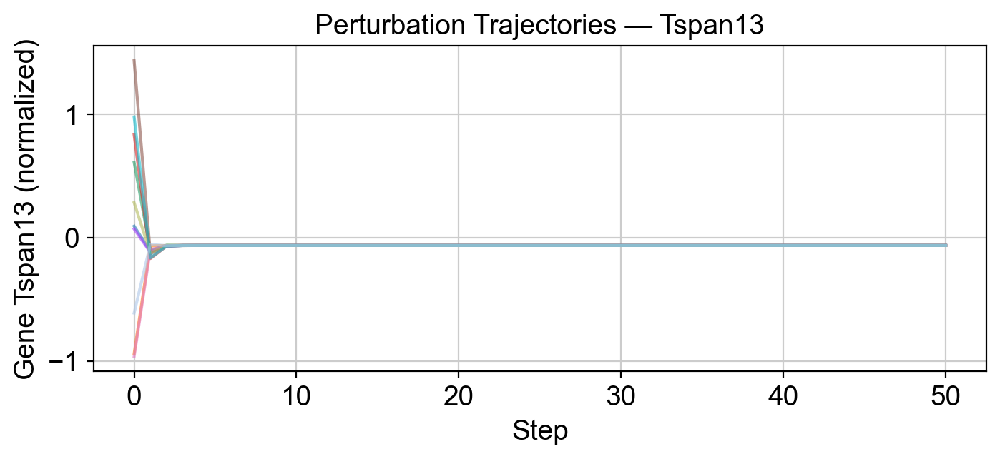


--- Eval Gene 6 (Jun) ---
Accuracy:  0.7050
Precision: 0.7443
Recall:    0.7050
F1 Score:  0.7075


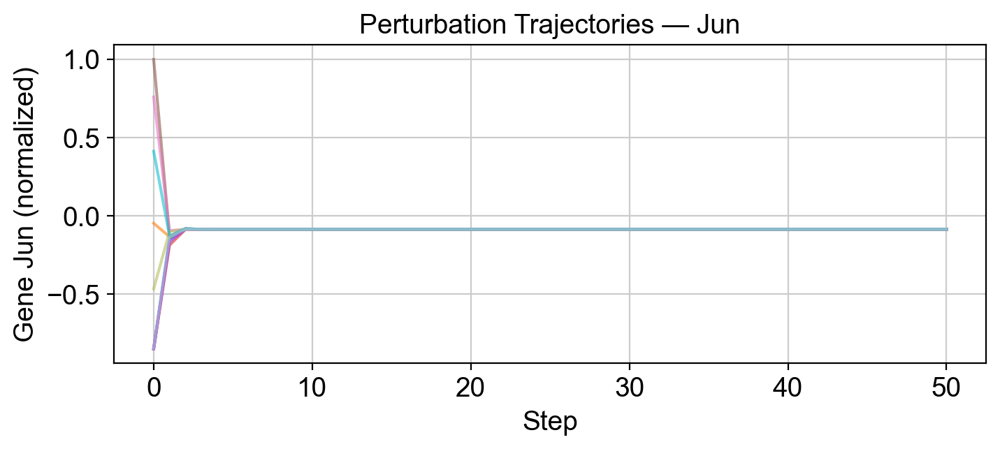


--- Eval Gene 7 (Ifitm3) ---
Accuracy:  0.7550
Precision: 0.7798
Recall:    0.7550
F1 Score:  0.7574


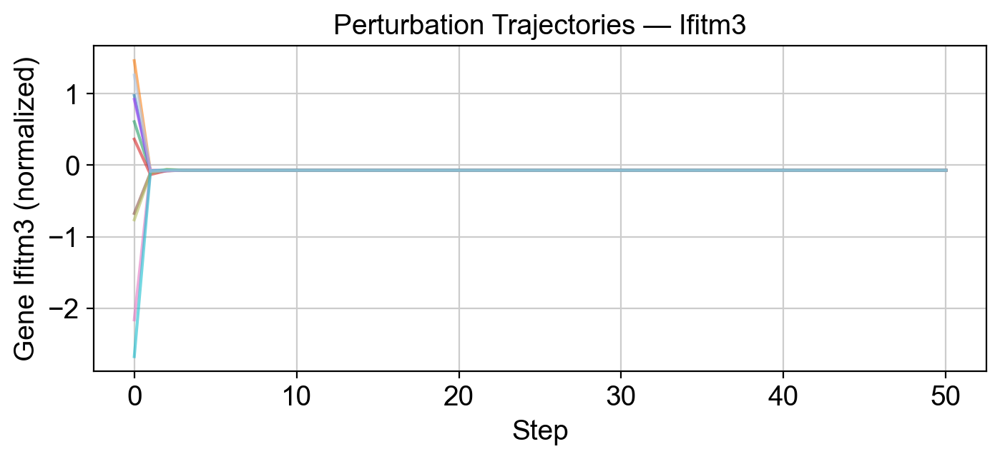


--- Eval Gene 8 (Ifi202b) ---
Accuracy:  0.6250
Precision: 0.6814
Recall:    0.6250
F1 Score:  0.6317


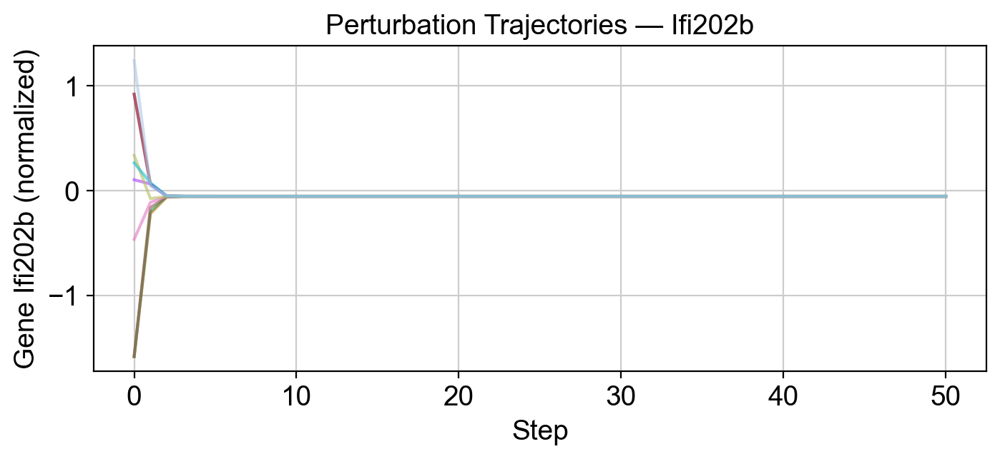


--- Eval Gene 9 (Cd3g) ---
Accuracy:  0.6750
Precision: 0.7309
Recall:    0.6750
F1 Score:  0.6795


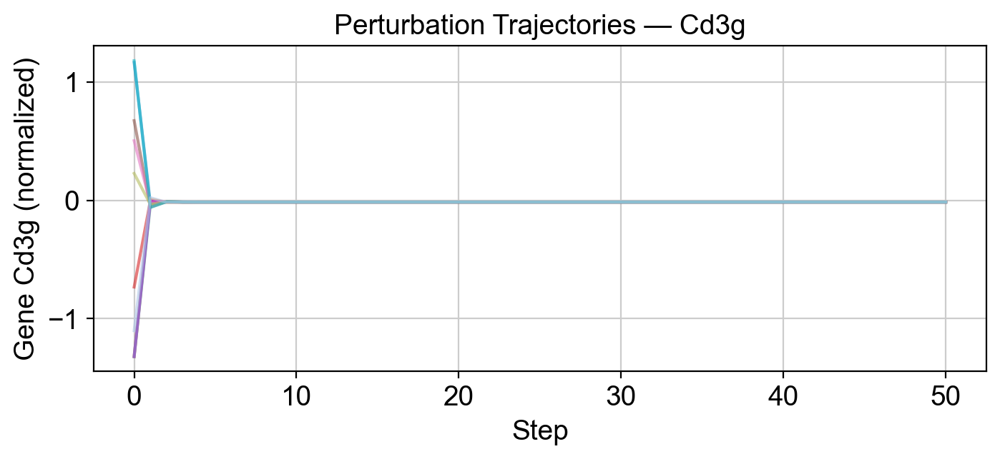

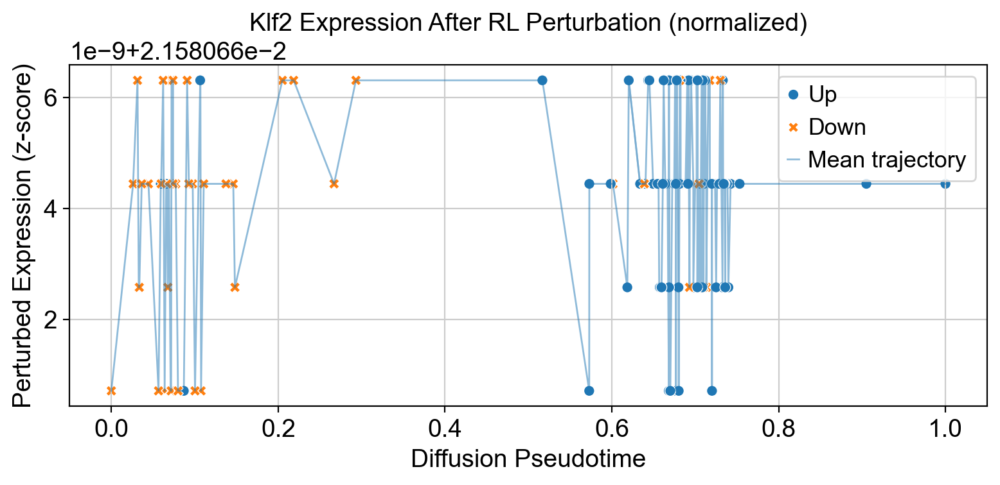

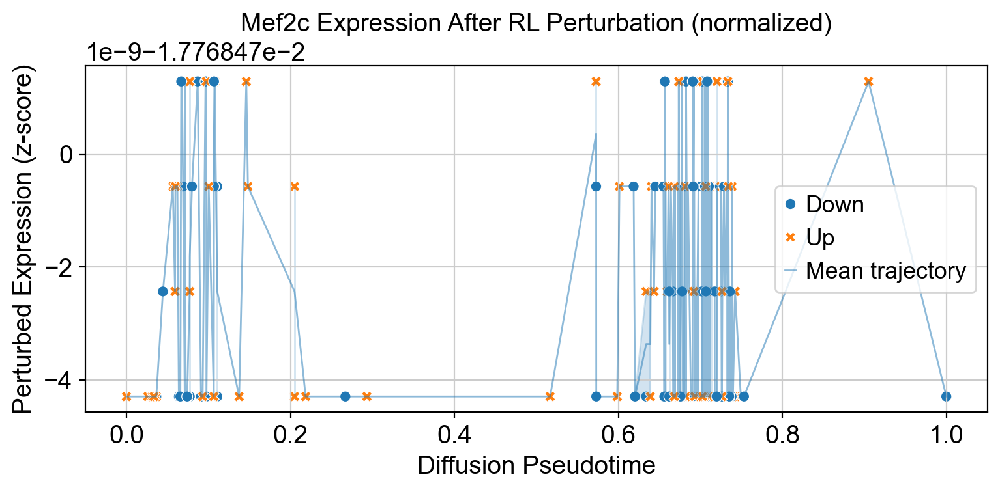

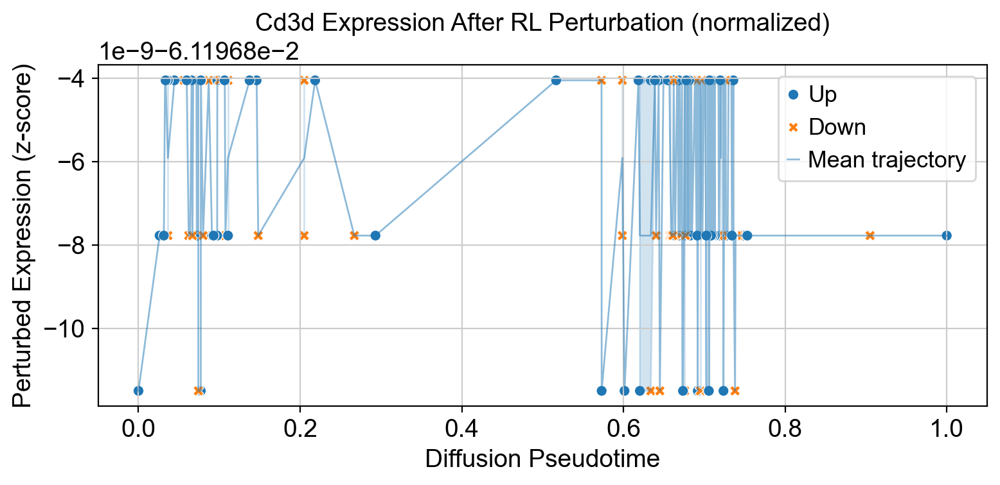

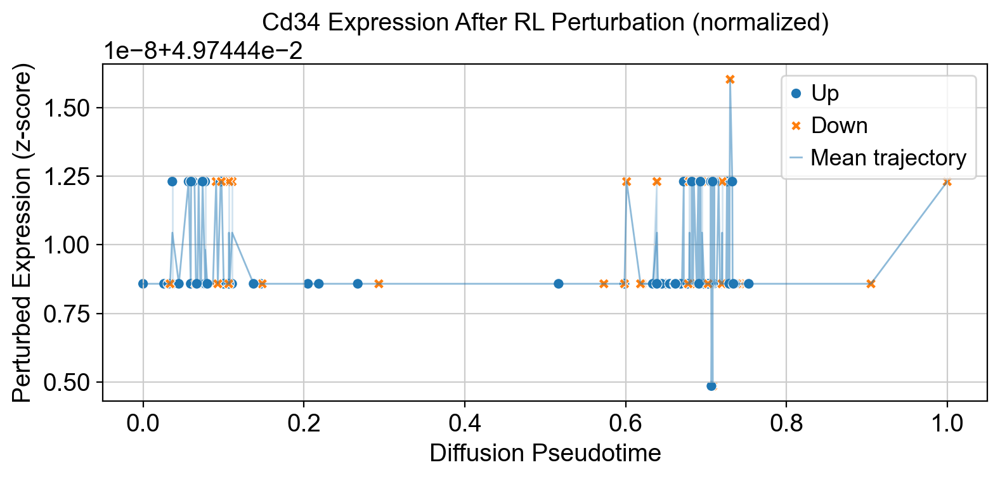

...

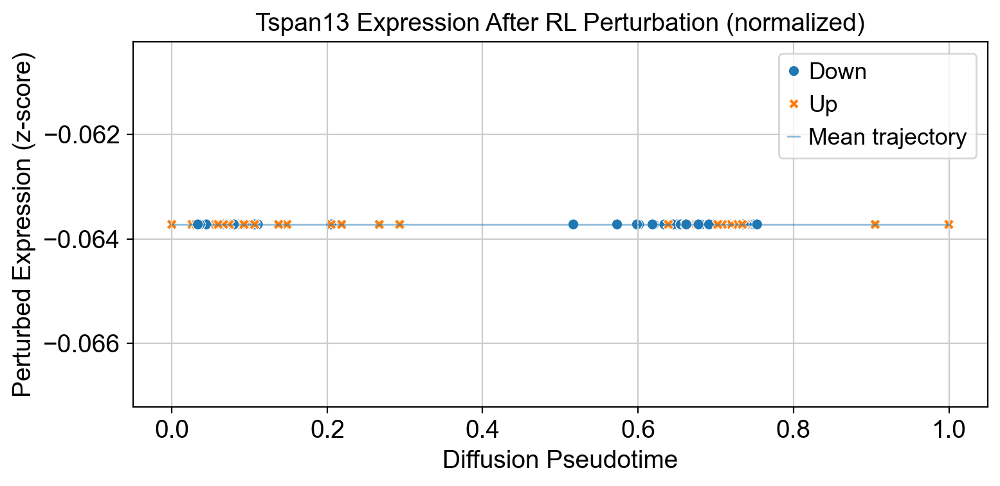

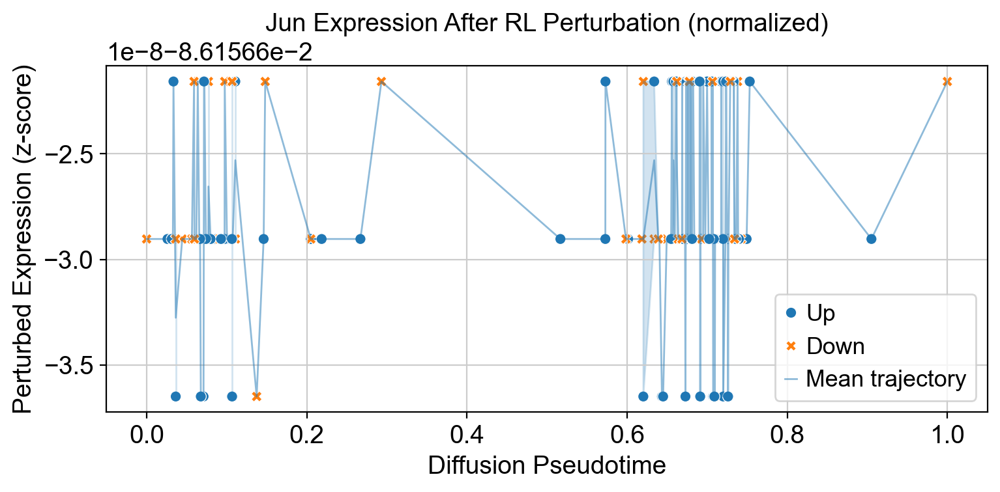

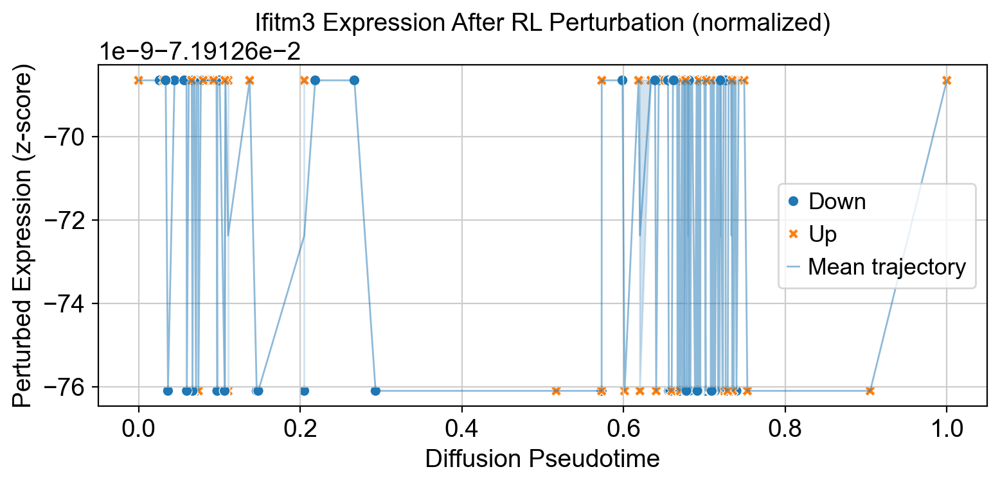

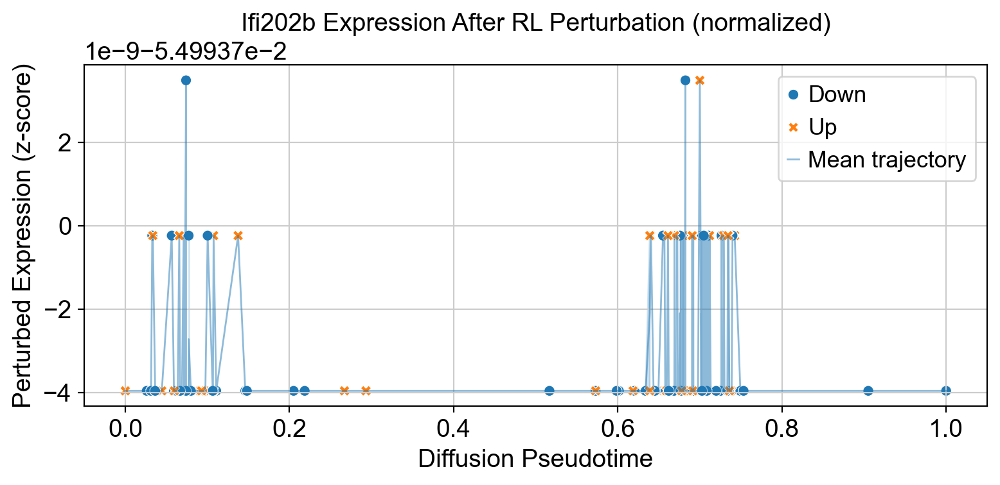

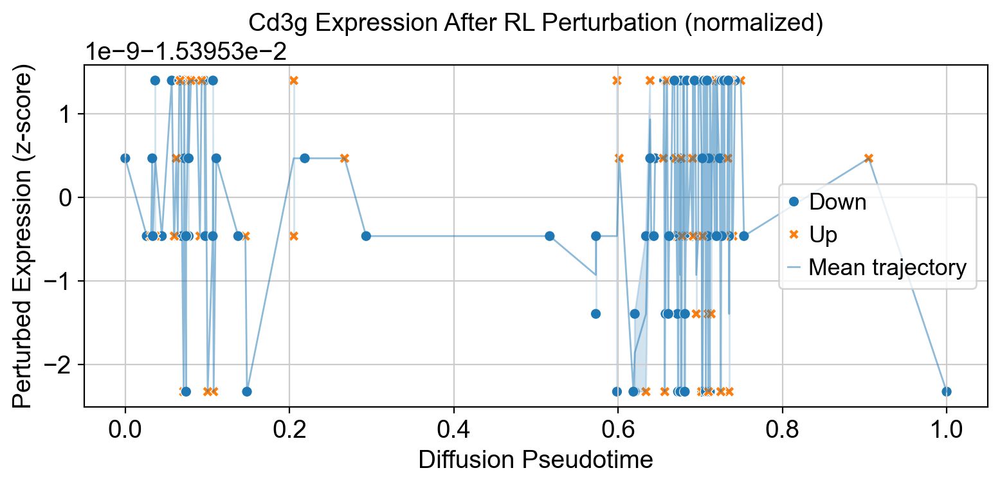

Done.


In [78]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# ----------------- Step 11: Evaluation -----------------
def evaluate_all_genes(model, expression_test, adj_matrix, pseudotime_test, gene_names,
                       edge_index, edge_weight, encoder_path, n_episodes=200):
    results = {}
    all_perturbed_states = {i: [] for i in range(len(gene_names))}
    all_original_states = {i: [] for i in range(len(gene_names))}
    all_pseudotimes = []

    eval_env_factory = make_env_factory(expression_test, adj_matrix, pseudotime_test,
                                       edge_index, edge_weight, encoder_path,
                                       adaptive_thresholds, dynamics_model)

    for local_idx in range(len(gene_names)):
        y_true, y_pred = [], []
        gene_trajs = []
        gene_idx = local_idx

        for ep in range(n_episodes):
            env = eval_env_factory()
            obs, _ = env.reset()
            original = env.original_state.copy()
            target = env.target.copy()
            pt_value = float(env.pseudotime[env.current_cell])

            done = False
            while not done:
                action, _ = model.predict(obs, deterministic=True)
                step_out = env.step(action)
                if len(step_out) == 5:
                    obs, reward, terminated, truncated, info = step_out
                    done = bool(terminated or truncated)
                else:
                    obs, reward, done, info = step_out

            final_raw_state = env.history[-1]
            delta = float(final_raw_state[gene_idx] - original[gene_idx])
            label = 1 if target[gene_idx] > original[gene_idx] else 0
            prediction = 1 if delta > 0 else 0

            y_true.append(label)
            y_pred.append(prediction)
            gene_trajs.append(np.array(env.history)[:, gene_idx])

            all_perturbed_states[gene_idx].append(float(final_raw_state[gene_idx]))
            all_original_states[gene_idx].append(float(original[gene_idx]))
            all_pseudotimes.append(pt_value)

        acc = accuracy_score(y_true, y_pred) if y_true else 0.0
        prec = precision_score(y_true, y_pred, average='weighted', zero_division=0) if y_true else 0.0
        rec = recall_score(y_true, y_pred, average='weighted', zero_division=0) if y_true else 0.0
        f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0) if y_true else 0.0

        results[local_idx] = {
            "gene_name": gene_names[local_idx],
            "accuracy": acc,
            "precision": prec,
            "recall": rec,
            "f1_score": f1,
            "trajectories": gene_trajs[:100]
        }

        print(f"\n--- Eval Gene {local_idx} ({gene_names[local_idx]}) ---")
        print(f"Accuracy:  {acc:.4f}")
        print(f"Precision: {prec:.4f}")
        print(f"Recall:    {rec:.4f}")
        print(f"F1 Score:  {f1:.4f}")

        plt.figure(figsize=(8, 3))
        for traj in gene_trajs[:10]:
            plt.plot(traj, alpha=0.6)
        plt.xlabel("Step")
        plt.ylabel(f"Gene {gene_names[local_idx]} (normalized)")
        plt.title(f"Perturbation Trajectories — {gene_names[local_idx]}")
        plt.grid(True)
        plt.show()

    return results, all_perturbed_states, all_original_states, all_pseudotimes

# Run evaluation
results, all_perturbed_states, all_original_states, all_pseudotimes = evaluate_all_genes(
    model=model,
    expression_test=expression_test,
    adj_matrix=adj_matrix,
    pseudotime_test=pseudotime_test,
    gene_names=selected_gene_names,
    edge_index=edge_index,
    edge_weight=edge_weight,
    encoder_path="gcn_encoder.pth",
    n_episodes=200
)

# ----------------- Step 12: Visualize perturbation along pseudotime -----------------
for local_idx, gene_name in enumerate(selected_gene_names):
    perturbed = all_perturbed_states[local_idx]
    original = all_original_states[local_idx]
    pseudotimes = all_pseudotimes[:len(perturbed)] if len(all_pseudotimes) > 0 else [0] * len(perturbed)

    if len(perturbed) == 0:
        continue

    df = pd.DataFrame({
        "pseudotime": pseudotimes,
        "original_expression": original[:len(perturbed)],
        "perturbed_expression": perturbed
    })
    df['delta'] = df['perturbed_expression'] - df['original_expression']
    df['label'] = df['delta'].apply(lambda x: "Up" if x > 0 else "Down")

    plt.figure(figsize=(8, 4))
    sns.scatterplot(data=df, x="pseudotime", y="perturbed_expression", hue="label", style="label")
    sns.lineplot(data=df.sort_values('pseudotime'), x="pseudotime", y="perturbed_expression",
                 lw=1, alpha=0.5, label="Mean trajectory")
    plt.title(f"{gene_name} Expression After RL Perturbation (normalized)")
    plt.xlabel("Diffusion Pseudotime")
    plt.ylabel("Perturbed Expression (z-score)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("Done.")
